**Business Problem Overview:**

In the telecom industry, customers are able to choose from multiple service providers and actively switch from one operator to another. In this highly competitive market, the telecommunications industry experiences an average of 15-25% annual churn rate. Given the fact that it costs 5-10 times more to acquire a new customer than to retain an existing one, customer retention has now become even more important than customer acquisition.

 

For many incumbent operators, retaining high profitable customers is the number one business goal.

 

To reduce customer churn, telecom companies need to predict which customers are at high risk of churn.

 

In this project, you will analyse customer-level data of a leading telecom firm, build predictive models to identify customers at high risk of churn and identify the main indicators of churn.

 

**Understanding and Defining Churn**

There are two main models of payment in the telecom industry - postpaid (customers pay a monthly/annual bill after using the services) and prepaid (customers pay/recharge with a certain amount in advance and then use the services).

 

In the postpaid model, when customers want to switch to another operator, they usually inform the existing operator to terminate the services, and you directly know that this is an instance of churn.

 

However, in the prepaid model, customers who want to switch to another network can simply stop using the services without any notice, and it is hard to know whether someone has actually churned or is simply not using the services temporarily (e.g. someone may be on a trip abroad for a month or two and then intend to resume using the services again).

 

Thus, churn prediction is usually more critical (and non-trivial) for prepaid customers, and the term ‘churn’ should be defined carefully.  Also, prepaid is the most common model in India and southeast Asia, while postpaid is more common in Europe in North America.

 

This project is based on the Indian and Southeast Asian market.

 

**Definitions of Churn**

There are various ways to define churn, such as:

Revenue-based churn: Customers who have not utilised any revenue-generating facilities such as mobile internet, outgoing calls, SMS etc. over a given period of time. One could also use aggregate metrics such as ‘customers who have generated less than INR 4 per month in total/average/median revenue’.

 

The main shortcoming of this definition is that there are customers who only receive calls/SMSes from their wage-earning counterparts, i.e. they don’t generate revenue but use the services. For example, many users in rural areas only receive calls from their wage-earning siblings in urban areas.

 

Usage-based churn: Customers who have not done any usage, either incoming or outgoing - in terms of calls, internet etc. over a period of time.

 

A potential shortcoming of this definition is that when the customer has stopped using the services for a while, it may be too late to take any corrective actions to retain them. For e.g., if you define churn based on a ‘two-months zero usage’ period, predicting churn could be useless since by that time the customer would have already switched to another operator.

 

In this project, you will use the usage-based definition to define churn.

 

**High-value Churn**

In the Indian and the southeast Asian market, approximately 80% of revenue comes from the top 20% customers (called high-value customers). Thus, if we can reduce churn of the high-value customers, we will be able to reduce significant revenue leakage.

 

In this project, you will define high-value customers based on a certain metric (mentioned later below) and predict churn only on high-value customers.

 

**Understanding the Business Objective and the Data**

The dataset contains customer-level information for a span of four consecutive months - June, July, August and September. The months are encoded as 6, 7, 8 and 9, respectively. 


The business objective is to predict the churn in the last (i.e. the ninth) month using the data (features) from the first three months. To do this task well, understanding the typical customer behaviour during churn will be helpful.

 

**Understanding Customer Behaviour During Churn**

Customers usually do not decide to switch to another competitor instantly, but rather over a period of time (this is especially applicable to high-value customers). In churn prediction, we assume that there are three phases of customer lifecycle :

The ‘good’ phase: In this phase, the customer is happy with the service and behaves as usual.

The ‘action’ phase: The customer experience starts to sore in this phase, for e.g. he/she gets a compelling offer from a  competitor, faces unjust charges, becomes unhappy with service quality etc. In this phase, the customer usually shows different behaviour than the ‘good’ months. Also, it is crucial to identify high-churn-risk customers in this phase, since some corrective actions can be taken at this point (such as matching the competitor’s offer/improving the service quality etc.)

The ‘churn’ phase: In this phase, the customer is said to have churned. You define churn based on this phase. Also, it is important to note that at the time of prediction (i.e. the action months), this data is not available to you for prediction. Thus, after tagging churn as 1/0 based on this phase, you discard all data corresponding to this phase.

 

In this case, since you are working over a four-month window, the first two months are the ‘good’ phase, the third month is the ‘action’ phase, while the fourth month is the ‘churn’ phase.

# Roadmap: Telecom Churn Case Study


1. Understanding the data
2. Data Preparation
3. EDA
4. Model Building
5. Model Selection
6. Model Evaluation
7. Conclusion






In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Import all necessary libraries

In [174]:
#data preperation libraries
import numpy as np, pandas as pd
from pandas.api.types import is_object_dtype
from pandas.api.types import is_numeric_dtype
from pandas.api.types import is_datetime64_ns_dtype

#visualization libraries
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.express as pe
import plotly.offline as po
import plotly.graph_objects as pg

#modelling libraries
from sklearn.preprocessing import StandardScaler,MinMaxScaler,RobustScaler,Binarizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,GradientBoostingClassifier
from sklearn.metrics import classification_report,confusion_matrix,precision_score,recall_score,precision_recall_curve,plot_precision_recall_curve,plot_roc_curve,roc_auc_score
from sklearn.decomposition import PCA
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.model_selection import GridSearchCV

#Handling Imbalanced Data
# Imporing SMOTE
from imblearn.over_sampling import SMOTE

# Supress Warnings
import warnings
warnings.filterwarnings('ignore')

#To ensure that any numerical data does not display as scientific notation
pd.options.display.float_format = '{:,.3f}'.format

pd.set_option("display.max_columns", None)

# 1. Understanding the data



In [3]:
telecom_data = pd.read_csv('/content/drive/MyDrive/Telecom_Churn_CaseStudy/telecom_churn_data.csv')

In [4]:
telecom_data.head(10)

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.000,0.000,0.000,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,nan,nan,0.000,nan,nan,nan,0.000,nan,nan,nan,0.000,nan,nan,nan,0.000,nan,nan,nan,0.000,nan,nan,nan,0.000,nan,nan,nan,0.000,nan,nan,nan,0.000,nan,nan,nan,0.000,nan,nan,nan,0.000,nan,nan,nan,0.000,nan,nan,nan,0.000,nan,nan,nan,0.000,nan,nan,nan,0.000,nan,nan,nan,0.000,nan,nan,nan,0.000,nan,nan,nan,0.000,nan,0.000,0.000,0.000,0.000,nan,nan,0.160,nan,nan,nan,4.130,nan,nan,nan,1.150,nan,nan,nan,5.440,nan,nan,nan,0.000,nan,nan,nan,0.000,nan,nan,nan,0.000,nan,nan,nan,0.000,nan,nan,nan,0.000,nan,0.000,0.000,5.440,0.000,nan,nan,

In [5]:
telecom_data.describe()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,"99,999.000","99,999.000","98,981.000","98,981.000","98,981.000","99,999.000","99,999.000","99,999.000","99,999.000","96,062.000","96,140.000","94,621.000","92,254.000","96,062.000","96,140.000","94,621.000","92,254.000","96,062.000","96,140.000","94,621.000","92,254.000","96,062.000","96,140.000","94,621.000","92,254.000","96,062.000","96,140.000","94,621.000","92,254.000","96,062.000","96,140.000","94,621.000","92,254.000","96,062.000","96,140.000","94,621.000","92,254.000","96,062.000","96,140.000","94,621.000","92,254.000","96,062.000","96,140.000","94,621.000","92,254.000","96,062.000","96,140.000","94,621.000","92,254.000","96,062.000","96,140.000","94,621.000","92,254.000","96,062.000","96,140.000","94,621.000","92,254.000","96,062.000","96,140.000","94,621.000","92,254.000","96,062.000","96,140.000","94,621.000","92,254.000","96,062.000","96,140.000","94,621.000","92,

In [6]:
telecom_data.shape

(99999, 226)

In [7]:
telecom_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Columns: 226 entries, mobile_number to sep_vbc_3g
dtypes: float64(179), int64(35), object(12)
memory usage: 172.4+ MB


In [8]:
#Reading Excel file
data_dict=pd.read_excel('/content/drive/MyDrive/Telecom_Churn_CaseStudy/Data+Dictionary-+Telecom+Churn+Case+Study.xlsx')

#Let's check the data_dict

data_dict.columns=data_dict.columns.str.strip()

data_dict=data_dict.set_index('Acronyms')

data_dict

,Descriptions
Acronyms,
MOBILE_NUMBER,Customer phone number
CIRCLE_ID,Telecom circle area to which the customer belo...
LOC,Local calls - within same telecom circle
STD,STD calls - outside the calling circle
IC,Incoming calls
OG,Outgoing calls
T2T,"Operator T to T, i.e. within same operator (mo..."
T2M,Operator T to other operator mobile
T2O,Operator T to other operator fixed line


In [9]:
data_dict.index=data_dict.index.str.strip()

In [10]:
def column_desc(column):
  return column,data_dict.loc[column]['Descriptions']
  
#Testing Function
column_desc('VBC')


('VBC',
 'Volume based cost - when no specific scheme is not purchased and paid as per usage')

In [11]:
data_dict.shape

(38, 1)

# 2. Data Preparation

In [12]:
(telecom_data.isnull().sum().sort_values(ascending=False)/len(telecom_data)).head(50)

count_rech_2g_6            0.748
date_of_last_rech_data_6   0.748
count_rech_3g_6            0.748
av_rech_amt_data_6         0.748
max_rech_data_6            0.748
total_rech_data_6          0.748
arpu_3g_6                  0.748
arpu_2g_6                  0.748
night_pck_user_6           0.748
fb_user_6                  0.748
arpu_3g_7                  0.744
count_rech_2g_7            0.744
fb_user_7                  0.744
count_rech_3g_7            0.744
arpu_2g_7                  0.744
av_rech_amt_data_7         0.744
max_rech_data_7            0.744
night_pck_user_7           0.744
total_rech_data_7          0.744
date_of_last_rech_data_7   0.744
night_pck_user_9           0.741
date_of_last_rech_data_9   0.741
fb_user_9                  0.741
arpu_2g_9                  0.741
max_rech_data_9            0.741
arpu_3g_9                  0.741
total_rech_data_9          0.741
av_rech_amt_data_9         0.741
count_rech_3g_9            0.741
count_rech_2g_9            0.741
fb_user_8 

In [13]:
telecom_data.columns

Index(['mobile_number', 'circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou',
       'loc_ic_t2o_mou', 'last_date_of_month_6', 'last_date_of_month_7',
       'last_date_of_month_8', 'last_date_of_month_9', 'arpu_6',
       ...
       'sachet_3g_9', 'fb_user_6', 'fb_user_7', 'fb_user_8', 'fb_user_9',
       'aon', 'aug_vbc_3g', 'jul_vbc_3g', 'jun_vbc_3g', 'sep_vbc_3g'],
      dtype='object', length=226)

## Deriving new features

In [14]:
telecom_data['total_amt_6_7']=(telecom_data['total_rech_amt_6'] + telecom_data['total_rech_amt_7'])/2

telecom_data['total_amt_6_7'].quantile(0.70)

368.5

In [15]:
telecom_data['total_amt_6_7'].describe(percentiles= [.25, .55,.70, .75])

count   99,999.000
mean       325.239
std        370.833
min          0.000
25%        115.000
50%        229.000
55%        255.000
70%        368.500
75%        419.000
max     37,762.500
Name: total_amt_6_7, dtype: float64

In [16]:
hv_cust = telecom_data.loc[telecom_data['total_amt_6_7'] > telecom_data['total_amt_6_7'].quantile(0.7)]

In [17]:
hv_cust.shape

(29979, 227)

In [18]:
#Target variable "Churn"

churn_cols=['total_ic_mou_9','total_og_mou_9','vol_2g_mb_9','vol_3g_mb_9']
hv_cust['churn']=np.where(hv_cust[churn_cols].sum(axis=1)==0,1,0)
hv_cust[churn_cols+['churn']]

,total_ic_mou_9,total_og_mou_9,vol_2g_mb_9,vol_3g_mb_9,churn
7,0.000,0.000,0.000,0.000,1
8,34.910,142.180,0.000,0.000,0
13,631.860,446.090,0.000,0.000,0
16,334.560,255.740,0.000,0.000,0
17,87.130,631.080,0.000,0.000,0
...,...,...,...,...,...
99970,248.880,402.710,0.000,0.000,0
99974,88.630,368.490,0.000,0.000,0
99986,547.110,"1,095.240",9.140,941.480,0
99988,265.840,182.160,0.050,393.340,0


In [19]:
churn_phase=[col for col in hv_cust.columns if '_9' in col]

In [20]:
hv_cust=hv_cust.drop(churn_phase,axis=1)

In [21]:
hv_cust.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,total_amt_6_7,churn
7,7000701601,109,0.000,0.000,0.000,6/30/2014,7/31/2014,8/31/2014,"1,069.180","1,349.850","3,171.480",57.840,54.680,52.290,453.430,567.160,325.910,16.230,33.490,31.640,23.740,12.590,38.060,51.390,31.380,40.280,308.630,447.380,162.280,62.130,55.140,53.230,0.000,0.000,0.000,422.160,533.910,255.790,4.300,23.290,12.010,49.890,31.760,49.140,6.660,20.080,16.680,0.000,0.000,0.000,60.860,75.140,77.840,0.000,0.180,10.010,4.500,0.000,6.500,0.000,0.000,0.000,487.530,609.240,350.160,58.140,32.260,27.310,217.560,221.490,121.190,152.160,101.460,39.530,427.880,355.230,188.040,36.890,11.830,30.390,91.440,126.990,141.330,52.190,34.240,22.210,0.000,0.000,0.000,180.540,173.080,193.940,626.460,558.040,428.740,0.210,0.000,0.000,2.060,14.530,31.590,15.740,15.190,15.140,5,5,7,1580,790,3638,1580,790,1580,6/27/2014,7/25/2014,8/26/2014,0,0,779,NaN,NaN,NaN,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.000,0.000,0.000,0.000,0.000,0.000,nan,nan,nan,nan,nan,nan,nan,nan,nan,0,0,0,0,0,0,0,0,0,0,0,0,nan,nan,nan,802,57.740,19.380,18.740,0.000,"1,185.000",1
8,7001524846,109,0.000,0.000,0.000,6/30/2014,7/31/2014,8/31/2014,378.721,492.223,137.362,413.690,351.030,35.080,94.660,80.630,136.480,0.000,0.000,0.000,0.000,0.000,0.000,297.130,217.590,12.490,80.960,70.580,50.540,0.000,0.000,0.000,0.000,0.000,7.150,378.090,288.180,63.040,116.560,133.430,22.580,13.690,10.040,75.690,0.000,0.000,0.000,0.000,0.000,0.000,130.260,143.480,

In [22]:
hv_cust.reset_index(inplace=True,drop=True)

In [23]:
hv_cust

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,total_amt_6_7,churn
0,7000701601,109,0.000,0.000,0.000,6/30/2014,7/31/2014,8/31/2014,"1,069.180","1,349.850","3,171.480",57.840,54.680,52.290,453.430,567.160,325.910,16.230,33.490,31.640,23.740,12.590,38.060,51.390,31.380,40.280,308.630,447.380,162.280,62.130,55.140,53.230,0.000,0.000,0.000,422.160,533.910,255.790,4.300,23.290,12.010,49.890,31.760,49.140,6.660,20.080,16.680,0.000,0.000,0.000,60.860,75.140,77.840,0.000,0.180,10.010,4.500,0.000,6.500,0.000,0.000,0.000,487.530,609.240,350.160,58.140,32.260,27.310,217.560,221.490,121.190,152.160,101.460,39.530,427.880,355.230,188.040,36.890,11.830,30.390,91.440,126.990,141.330,52.190,34.240,22.210,0.000,0.000,0.000,180.540,173.080,193.940,626.460,558.040,428.740,0.210,0.000,0.000,2.060,14.530,31.590,15.740,15.190,15.140,5,5,7,1580,790,3638,1580,790,1580,6/27/2014,7/25/2014,8/26/2014,0,0,779,NaN,NaN,NaN,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.000,0.000,0.000,0.000,0.000,0.000,nan,nan,nan,nan,nan,nan,nan,nan,nan,0,0,0,0,0,0,0,0,0,0,0,0,nan,nan,nan,802,57.740,19.380,18.740,0.000,"1,185.000",1
1,7001524846,109,0.000,0.000,0.000,6/30/2014,7/31/2014,8/31/2014,378.721,492.223,137.362,413.690,351.030,35.080,94.660,80.630,136.480,0.000,0.000,0.000,0.000,0.000,0.000,297.130,217.590,12.490,80.960,70.580,50.540,0.000,0.000,0.000,0.000,0.000,7.150,378.090,288.180,63.040,116.560,133.430,22.580,13.690,10.040,75.690,0.000,0.000,0.000,0.000,0.000,0.000,130.260,143.480,

In [24]:
hv_cust['churn'].value_counts(1)

0   0.914
1   0.086
Name: churn, dtype: float64

In [25]:
hv_cust['churn'].value_counts()

0    27390
1     2589
Name: churn, dtype: int64

#### Observation: 
After filtering telecom_data with High value customer we find that only 2589 customer tend to churn which is 8.63%. Hence Data is highly imbalanced.

In [26]:
(hv_cust.isnull().sum().sort_values(ascending=False)/len(hv_cust)).head(50)

total_rech_data_6          0.620
fb_user_6                  0.620
av_rech_amt_data_6         0.620
count_rech_2g_6            0.620
max_rech_data_6            0.620
arpu_3g_6                  0.620
arpu_2g_6                  0.620
night_pck_user_6           0.620
date_of_last_rech_data_6   0.620
count_rech_3g_6            0.620
arpu_2g_7                  0.611
date_of_last_rech_data_7   0.611
count_rech_3g_7            0.611
count_rech_2g_7            0.611
max_rech_data_7            0.611
total_rech_data_7          0.611
arpu_3g_7                  0.611
night_pck_user_7           0.611
av_rech_amt_data_7         0.611
fb_user_7                  0.611
max_rech_data_8            0.608
count_rech_2g_8            0.608
night_pck_user_8           0.608
fb_user_8                  0.608
arpu_2g_8                  0.608
count_rech_3g_8            0.608
arpu_3g_8                  0.608
av_rech_amt_data_8         0.608
date_of_last_rech_data_8   0.608
total_rech_data_8          0.608
std_og_t2m

In [27]:
def drop_cols(col):
  print('before dropping:', hv_cust.shape)
  hv_cust.drop(col,axis=1,inplace=True)
  print('after dropping:', hv_cust.shape)

In [28]:
#Filtering all the columns with constant values
const_cols = [col for col in hv_cust.columns if hv_cust[col].nunique()==1]

In [29]:
#Filter all the date columns
date_cols = [col for col in hv_cust.columns if hv_cust[col].dtype == 'O']

In [30]:
#Getting the columns for which values are unique
id_col = [col for col in hv_cust.columns if hv_cust[col].nunique()>=len(hv_cust)]

In [31]:
drop_cols(const_cols+date_cols+id_col)

before dropping: (29979, 174)
after dropping: (29979, 154)


In [32]:
#Filter all categorical columns
cat_cols = [col for col in hv_cust.columns if hv_cust[col].nunique()<=20]

In [33]:
#Filter all numerical columns
num_cols = [col for col in hv_cust.columns if hv_cust[col].nunique()>20]

In [34]:
hv_cust.isnull().sum().sort_values(ascending=False).head(60)

count_rech_2g_6       18592
arpu_2g_6             18592
av_rech_amt_data_6    18592
night_pck_user_6      18592
count_rech_3g_6       18592
max_rech_data_6       18592
total_rech_data_6     18592
fb_user_6             18592
arpu_3g_6             18592
av_rech_amt_data_7    18327
total_rech_data_7     18327
arpu_2g_7             18327
max_rech_data_7       18327
night_pck_user_7      18327
fb_user_7             18327
count_rech_2g_7       18327
count_rech_3g_7       18327
arpu_3g_7             18327
arpu_3g_8             18238
arpu_2g_8             18238
count_rech_2g_8       18238
count_rech_3g_8       18238
av_rech_amt_data_8    18238
night_pck_user_8      18238
max_rech_data_8       18238
total_rech_data_8     18238
fb_user_8             18238
std_ic_t2m_mou_8        938
loc_og_t2c_mou_8        938
std_ic_t2f_mou_8        938
loc_og_mou_8            938
std_og_t2t_mou_8        938
std_ic_mou_8            938
std_og_t2f_mou_8        938
std_og_t2m_mou_8        938
ic_others_8         

In [35]:
missing_cols=[col for col in hv_cust.columns if hv_cust[col].isnull().any()]

In [36]:
def common_member(a, b):
    a_set = set(a)
    b_set = set(b)
 
    if (a_set & b_set):
        print(list(a_set & b_set))
    else:
        print("No common elements")

    return list(a_set & b_set)

missing_cat_cols=common_member(missing_cols,cat_cols)

['fb_user_8', 'night_pck_user_6', 'night_pck_user_7', 'fb_user_7', 'night_pck_user_8', 'fb_user_6']


In [37]:
missing_num_cols=list(set(missing_cols)-set(missing_cat_cols))
missing_num_cols

['arpu_3g_7',
 'max_rech_data_8',
 'arpu_3g_6',
 'offnet_mou_7',
 'roam_og_mou_7',
 'std_og_t2t_mou_8',
 'std_og_mou_6',
 'std_ic_t2m_mou_7',
 'total_rech_data_7',
 'arpu_2g_8',
 'std_og_t2t_mou_6',
 'max_rech_data_7',
 'loc_ic_mou_6',
 'spl_ic_mou_6',
 'loc_og_t2t_mou_7',
 'std_og_t2m_mou_7',
 'og_others_7',
 'loc_ic_t2t_mou_7',
 'loc_ic_t2f_mou_7',
 'loc_og_t2c_mou_7',
 'std_ic_t2m_mou_6',
 'isd_ic_mou_7',
 'loc_ic_mou_7',
 'count_rech_2g_7',
 'std_og_t2t_mou_7',
 'loc_og_t2t_mou_8',
 'av_rech_amt_data_6',
 'spl_ic_mou_7',
 'og_others_6',
 'isd_og_mou_6',
 'loc_ic_t2m_mou_8',
 'loc_og_mou_6',
 'ic_others_8',
 'loc_ic_mou_8',
 'std_og_t2f_mou_8',
 'total_rech_data_6',
 'spl_og_mou_8',
 'og_others_8',
 'std_og_t2f_mou_6',
 'loc_og_t2m_mou_8',
 'loc_ic_t2f_mou_6',
 'loc_ic_t2t_mou_6',
 'count_rech_2g_6',
 'arpu_3g_8',
 'roam_ic_mou_7',
 'total_rech_data_8',
 'roam_ic_mou_6',
 'max_rech_data_6',
 'spl_og_mou_6',
 'std_ic_mou_6',
 'loc_og_t2f_mou_8',
 'onnet_mou_6',
 'std_ic_t2f_mou_7',
 

In [38]:
(hv_cust[missing_num_cols].isnull().sum()/hv_cust.shape[0]).sort_values(ascending=False).head(60)

count_rech_2g_6      0.620
av_rech_amt_data_6   0.620
max_rech_data_6      0.620
count_rech_3g_6      0.620
total_rech_data_6    0.620
arpu_2g_6            0.620
arpu_3g_6            0.620
max_rech_data_7      0.611
count_rech_2g_7      0.611
total_rech_data_7    0.611
arpu_2g_7            0.611
av_rech_amt_data_7   0.611
count_rech_3g_7      0.611
arpu_3g_7            0.611
arpu_2g_8            0.608
arpu_3g_8            0.608
total_rech_data_8    0.608
max_rech_data_8      0.608
av_rech_amt_data_8   0.608
count_rech_2g_8      0.608
count_rech_3g_8      0.608
loc_og_t2f_mou_8     0.031
loc_ic_mou_8         0.031
std_ic_t2t_mou_8     0.031
std_ic_t2f_mou_8     0.031
loc_ic_t2m_mou_8     0.031
std_og_t2m_mou_8     0.031
offnet_mou_8         0.031
ic_others_8          0.031
std_og_t2f_mou_8     0.031
roam_ic_mou_8        0.031
std_ic_t2m_mou_8     0.031
spl_og_mou_8         0.031
std_og_mou_8         0.031
og_others_8          0.031
loc_og_mou_8         0.031
isd_og_mou_8         0.031
l

#### Note
- Segreggating the columns based on incoming, outgoing and recharge categories to observe the value patterns and conclude the strategy for the imputation.

In [39]:
ic_cols = [col for col in hv_cust.columns if 'ic' in col]
og_cols = [col for col in hv_cust.columns if 'og' in col]
rech_cols = [col for col in hv_cust.columns if 'rech' in col]
remaining_cols = set(missing_num_cols)-(set(ic_cols + og_cols + rech_cols))
print(ic_cols)
print(og_cols)
print(rech_cols)
print(remaining_cols)

['roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8', 'loc_ic_t2t_mou_6', 'loc_ic_t2t_mou_7', 'loc_ic_t2t_mou_8', 'loc_ic_t2m_mou_6', 'loc_ic_t2m_mou_7', 'loc_ic_t2m_mou_8', 'loc_ic_t2f_mou_6', 'loc_ic_t2f_mou_7', 'loc_ic_t2f_mou_8', 'loc_ic_mou_6', 'loc_ic_mou_7', 'loc_ic_mou_8', 'std_ic_t2t_mou_6', 'std_ic_t2t_mou_7', 'std_ic_t2t_mou_8', 'std_ic_t2m_mou_6', 'std_ic_t2m_mou_7', 'std_ic_t2m_mou_8', 'std_ic_t2f_mou_6', 'std_ic_t2f_mou_7', 'std_ic_t2f_mou_8', 'std_ic_mou_6', 'std_ic_mou_7', 'std_ic_mou_8', 'total_ic_mou_6', 'total_ic_mou_7', 'total_ic_mou_8', 'spl_ic_mou_6', 'spl_ic_mou_7', 'spl_ic_mou_8', 'isd_ic_mou_6', 'isd_ic_mou_7', 'isd_ic_mou_8', 'ic_others_6', 'ic_others_7', 'ic_others_8']
['roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8', 'loc_

#### Conclusion
- Imputing the values with 0 for incoming, outgoing, recharge and remaining cols of numerical columns from the high value customer data set. The reason for imputing with 0 is that most of values are the features that the end user is using. Mean or median value imputation may not help in this case. 
- For category coloumns using -1 as the imputer value to create the separate category rather than using the existing values to avoid the class impact

In [40]:
num_col_imputer = SimpleImputer(strategy='constant', fill_value=0)
cat_col_imputer = SimpleImputer(strategy='constant', fill_value=-1)

In [41]:
num_col_imputer.fit(hv_cust[missing_num_cols])

SimpleImputer(add_indicator=False, copy=True, fill_value=0, missing_values=nan,
              strategy='constant', verbose=0)

In [42]:
cat_col_imputer.fit(hv_cust[missing_cat_cols])

SimpleImputer(add_indicator=False, copy=True, fill_value=-1, missing_values=nan,
              strategy='constant', verbose=0)

In [43]:
hv_cust[missing_num_cols] = num_col_imputer.transform(hv_cust[missing_num_cols])
hv_cust[missing_num_cols].isnull().sum()

arpu_3g_7           0
max_rech_data_8     0
arpu_3g_6           0
offnet_mou_7        0
roam_og_mou_7       0
                   ..
loc_ic_t2f_mou_8    0
std_ic_t2t_mou_6    0
ic_others_6         0
std_ic_mou_7        0
count_rech_3g_8     0
Length: 102, dtype: int64

In [44]:
hv_cust[missing_cat_cols] = cat_col_imputer.transform(hv_cust[missing_cat_cols])
hv_cust[missing_cat_cols].isnull().sum()

fb_user_8           0
night_pck_user_6    0
night_pck_user_7    0
fb_user_7           0
night_pck_user_8    0
fb_user_6           0
dtype: int64

In [45]:
hv_cust[missing_cat_cols].head(5)

,fb_user_8,night_pck_user_6,night_pck_user_7,fb_user_7,night_pck_user_8,fb_user_6
0,-1.000,-1.000,-1.000,-1.000,-1.000,-1.000
1,1.000,-1.000,0.000,1.000,0.000,-1.000
2,1.000,-1.000,-1.000,-1.000,0.000,-1.000
3,-1.000,-1.000,-1.000,-1.000,-1.000,-1.000
4,-1.000,-1.000,-1.000,-1.000,-1.000,-1.000


# 3. Exploratory Data Analysis

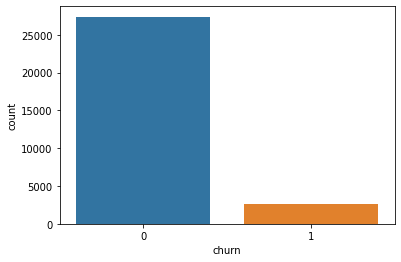

In [46]:
sns.countplot(data=hv_cust, x=hv_cust.churn)

#### Observation
- the count plot for the churn variable shows there is a class imbalance

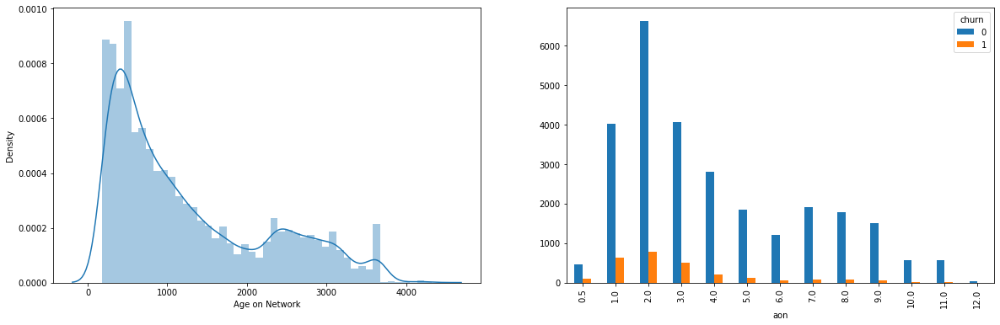

In [47]:
figure, (ax1, ax2) = plt.subplots(1,2,figsize=(20, 6))
#plt.figure(figsize=(8, 4))
sns.distplot(hv_cust, x=hv_cust.aon, axlabel='Age on Network', ax=ax1)

bins = [0, 0.5, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
labels = [0.5, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
pd.crosstab(pd.cut(round(((hv_cust['aon']/30)/12),1), bins = bins, labels = labels ), hv_cust['churn']).plot(kind='bar', ax = ax2)

#### Observations

- Churn rate for users who are with the provider for 1, 2, 3 years is very high.
- The ovserall sevice continuity for users is 1 to 4 years for this telecom provider.
- AON is a good indicator to target the process of identifying the high value customers and offer good packages.  

In [48]:
#Identify the Incoming usage columns and find the patterns and outliers.
ic_jun_usg = [col for col in hv_cust.columns if all(k in col for k in ['mou', '_6', 'ic'] )]
ic_jul_usg = [col for col in hv_cust.columns if all(k in col for k in ['mou', '_7', 'ic'] )]
ic_aug_usg = [col for col in hv_cust.columns if all(k in col for k in ['mou', '_8', 'ic'] )]

print(ic_jun_usg)
print(ic_jul_usg)
print(ic_aug_usg)

['roam_ic_mou_6', 'loc_ic_t2t_mou_6', 'loc_ic_t2m_mou_6', 'loc_ic_t2f_mou_6', 'loc_ic_mou_6', 'std_ic_t2t_mou_6', 'std_ic_t2m_mou_6', 'std_ic_t2f_mou_6', 'std_ic_mou_6', 'total_ic_mou_6', 'spl_ic_mou_6', 'isd_ic_mou_6']
['roam_ic_mou_7', 'loc_ic_t2t_mou_7', 'loc_ic_t2m_mou_7', 'loc_ic_t2f_mou_7', 'loc_ic_mou_7', 'std_ic_t2t_mou_7', 'std_ic_t2m_mou_7', 'std_ic_t2f_mou_7', 'std_ic_mou_7', 'total_ic_mou_7', 'spl_ic_mou_7', 'isd_ic_mou_7']
['roam_ic_mou_8', 'loc_ic_t2t_mou_8', 'loc_ic_t2m_mou_8', 'loc_ic_t2f_mou_8', 'loc_ic_mou_8', 'std_ic_t2t_mou_8', 'std_ic_t2m_mou_8', 'std_ic_t2f_mou_8', 'std_ic_mou_8', 'total_ic_mou_8', 'spl_ic_mou_8', 'isd_ic_mou_8']


In [49]:
from IPython.display import display, HTML
mnth_list = [ic_jun_usg, ic_jul_usg, ic_aug_usg]

for i in mnth_list:
  display(hv_cust[i].describe().T)

,count,mean,std,min,25%,50%,75%,max
roam_ic_mou_6,"29,979.000",17.428,79.193,0.000,0.000,0.000,0.000,"2,613.310"
loc_ic_t2t_mou_6,"29,979.000",68.772,158.703,0.000,8.290,29.140,73.670,"6,351.440"
loc_ic_t2m_mou_6,"29,979.000",159.679,222.093,0.000,33.460,93.980,202.920,"4,693.860"
loc_ic_t2f_mou_6,"29,979.000",15.605,45.848,0.000,0.000,1.960,12.440,"1,678.410"
loc_ic_mou_6,"29,979.000",244.065,312.931,0.000,56.710,151.080,315.620,"6,496.110"
std_ic_t2t_mou_6,"29,979.000",16.238,78.900,0.000,0.000,1.060,10.285,"5,459.560"
std_ic_t2m_mou_6,"29,979.000",32.030,101.127,0.000,0.455,7.090,27.560,"4,630.230"
std_ic_t2f_mou_6,"29,979.000",2.877,19.939,0.000,0.000,0.000,0.180,"1,351.110"
std_ic_mou_6,"29,979.000",51.150,140.565,0.000,2.630,15.060,47.560,"5,459.630"
total_ic_mou_6,"29,979.000",307.624,361.286,0.000,90.035,205.340,393.835,"6,798.640"


,count,mean,std,min,25%,50%,75%,max
roam_ic_mou_7,"29,979.000",13.535,76.343,0.000,0.000,0.000,0.000,"3,813.290"
loc_ic_t2t_mou_7,"29,979.000",70.329,167.371,0.000,9.470,30.130,74.735,"5,709.590"
loc_ic_t2m_mou_7,"29,979.000",160.856,219.513,0.000,38.130,96.840,203.535,"4,388.730"
loc_ic_t2f_mou_7,"29,979.000",16.519,49.501,0.000,0.000,2.210,13.040,"1,983.010"
loc_ic_mou_7,"29,979.000",247.714,315.581,0.000,63.550,154.860,316.785,"6,466.740"
std_ic_t2t_mou_7,"29,979.000",16.906,84.735,0.000,0.000,1.200,10.990,"5,800.930"
std_ic_t2m_mou_7,"29,979.000",33.489,105.835,0.000,0.480,7.480,29.250,"3,470.380"
std_ic_t2f_mou_7,"29,979.000",2.995,20.522,0.000,0.000,0.000,0.260,"1,136.080"
std_ic_mou_7,"29,979.000",53.395,149.237,0.000,2.785,16.130,50.390,"6,745.760"
total_ic_mou_7,"29,979.000",314.954,369.768,0.000,98.840,211.240,396.915,"7,279.080"


,count,mean,std,min,25%,50%,75%,max
roam_ic_mou_8,"29,979.000",13.263,74.588,0.000,0.000,0.000,0.000,"4,169.810"
loc_ic_t2t_mou_8,"29,979.000",65.959,155.769,0.000,6.810,26.840,70.360,"4,003.210"
loc_ic_t2m_mou_8,"29,979.000",153.649,217.059,0.000,29.660,89.830,197.015,"5,738.460"
loc_ic_t2f_mou_8,"29,979.000",14.713,43.730,0.000,0.000,1.850,11.610,"1,588.530"
loc_ic_mou_8,"29,979.000",234.331,307.121,0.000,49.990,142.880,302.110,"5,748.810"
std_ic_t2t_mou_8,"29,979.000",15.061,72.470,0.000,0.000,0.560,8.860,"4,309.290"
std_ic_t2m_mou_8,"29,979.000",30.433,105.329,0.000,0.000,5.710,25.330,"5,645.860"
std_ic_t2f_mou_8,"29,979.000",2.683,20.280,0.000,0.000,0.000,0.130,"1,394.890"
std_ic_mou_8,"29,979.000",48.181,141.010,0.000,1.430,12.560,43.435,"5,957.140"
total_ic_mou_8,"29,979.000",295.473,360.412,0.000,78.930,193.530,380.450,"5,990.710"


In [50]:
def plot_boxsubplots(var, data, fig_size):
    plt.figure(figsize=fig_size)
    sns.set(font_scale=2)
    size = len(var)
    maxcol = 3
    total_rows = int(size / maxcol) + (size % maxcol)
    for i in range(0,len(var)):
        plt.subplot(total_rows,maxcol,i+1)
        fig = sns.boxplot(y = data[var[i]], data = data, x=hv_cust['churn'], hue=hv_cust['churn'])
        fig.set_xlabel(var[i], color='black',fontweight='bold')
    plt.xticks(rotation=45)
    plt.show()

In [51]:
def plot_distsubplots(var, data, fig_size):
    plt.figure(figsize=fig_size)
    sns.set(font_scale=2)
    size = len(var)
    maxcol = 3
    total_rows = int(size / maxcol) + (size % maxcol)
    for i in range(0,len(var)):
        plt.subplot(total_rows,maxcol,i+1)
        fig = sns.distplot(x = data[var[i]])
        fig.set_xlabel(var[i], color='black',fontweight='bold')
    plt.show()

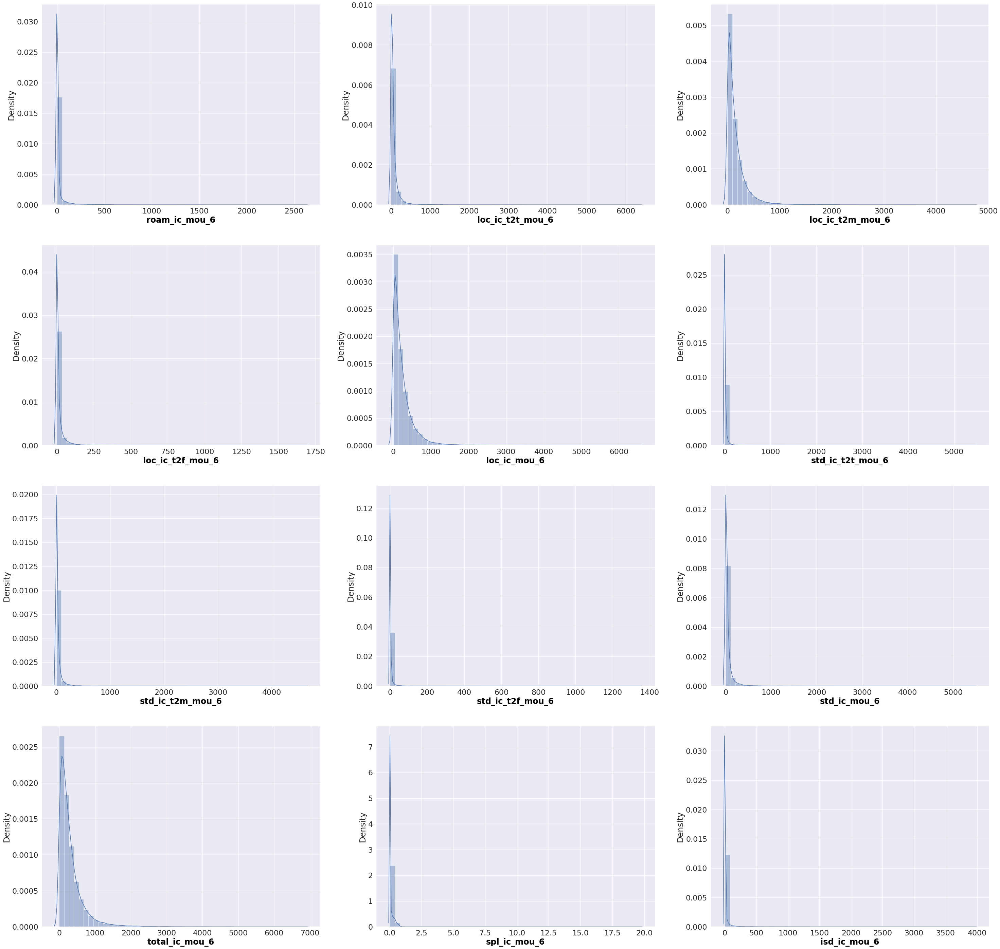

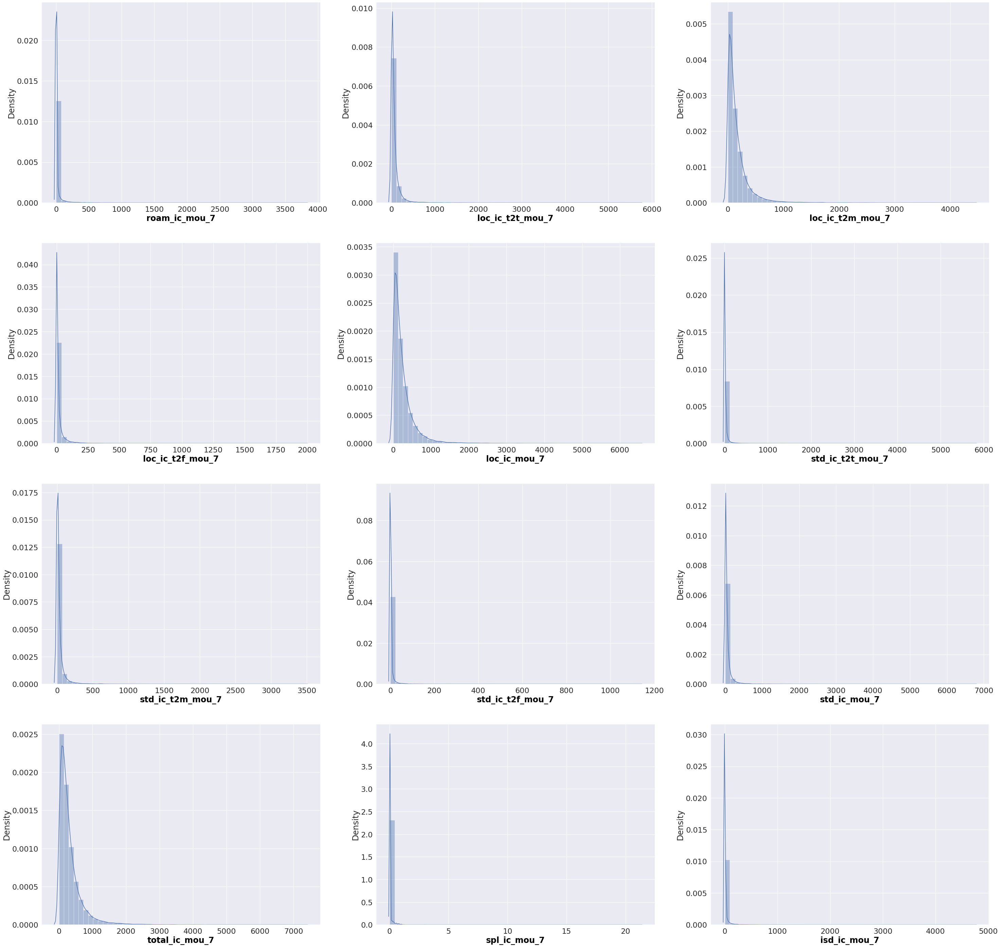

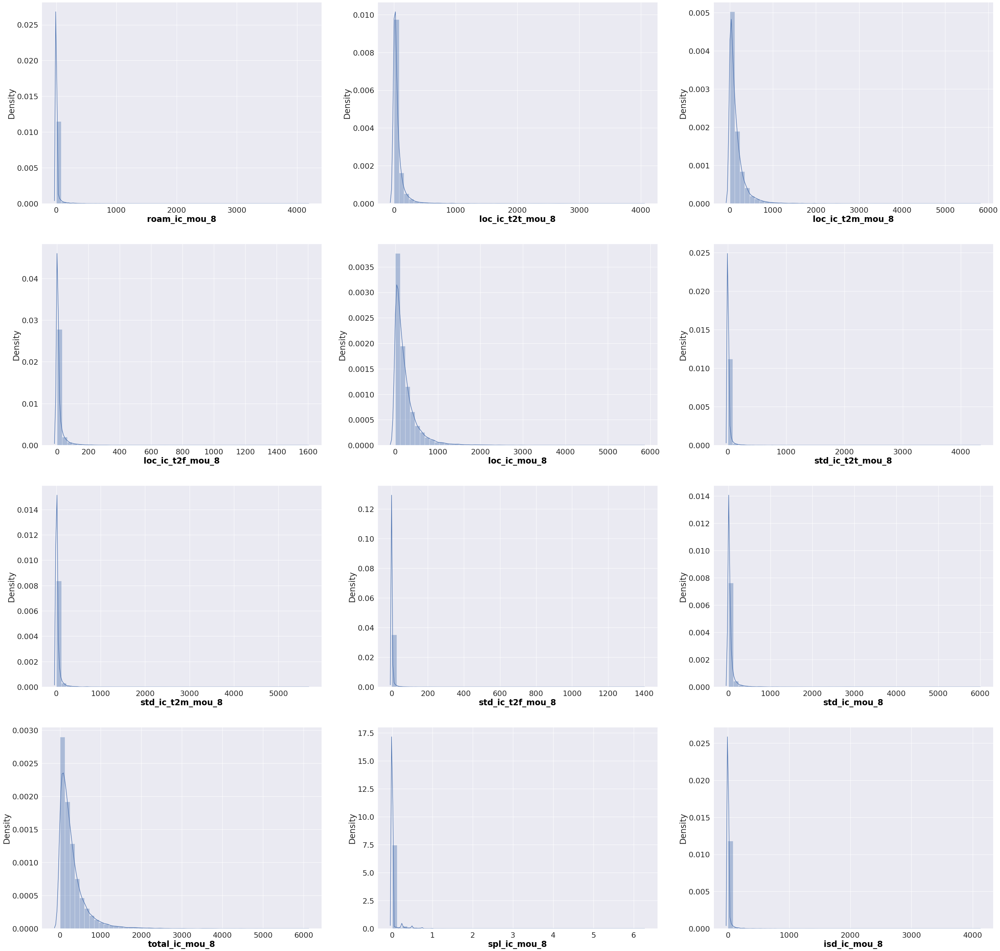

In [52]:
for i in mnth_list:
   plot_distsubplots(i, hv_cust, fig_size=(50, 50))

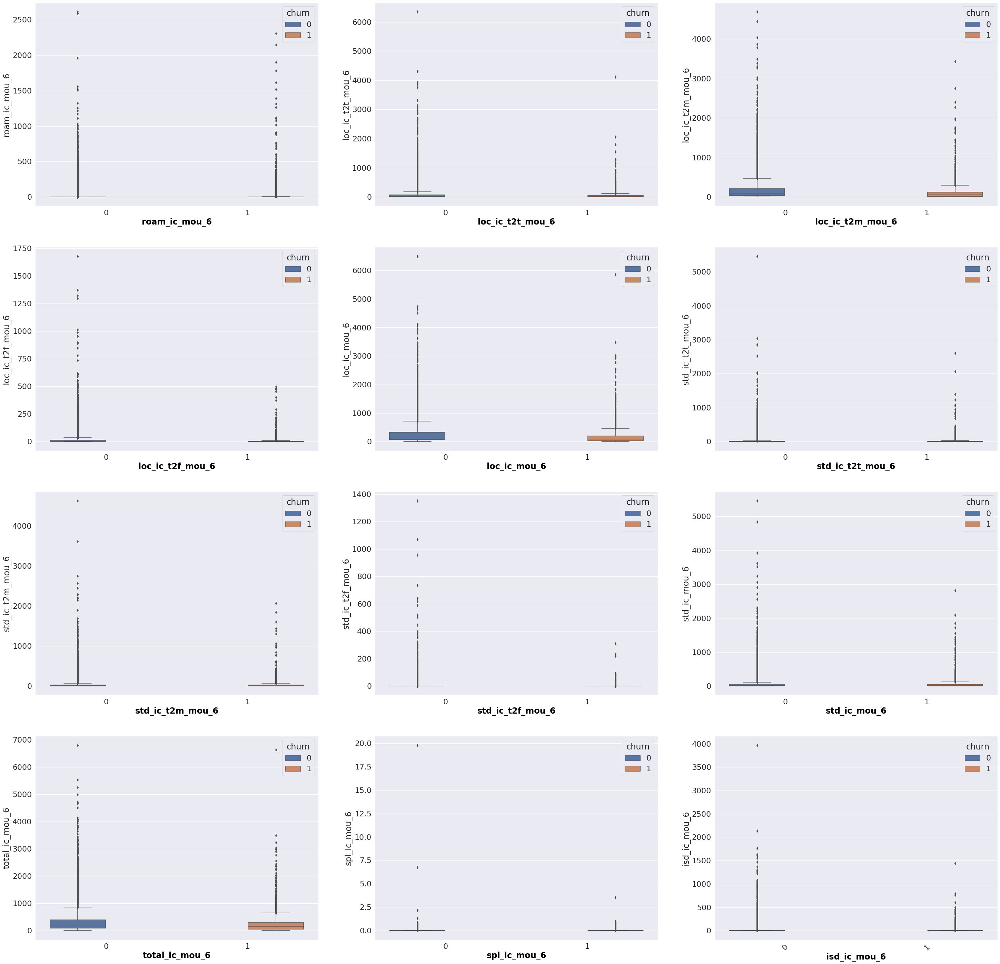

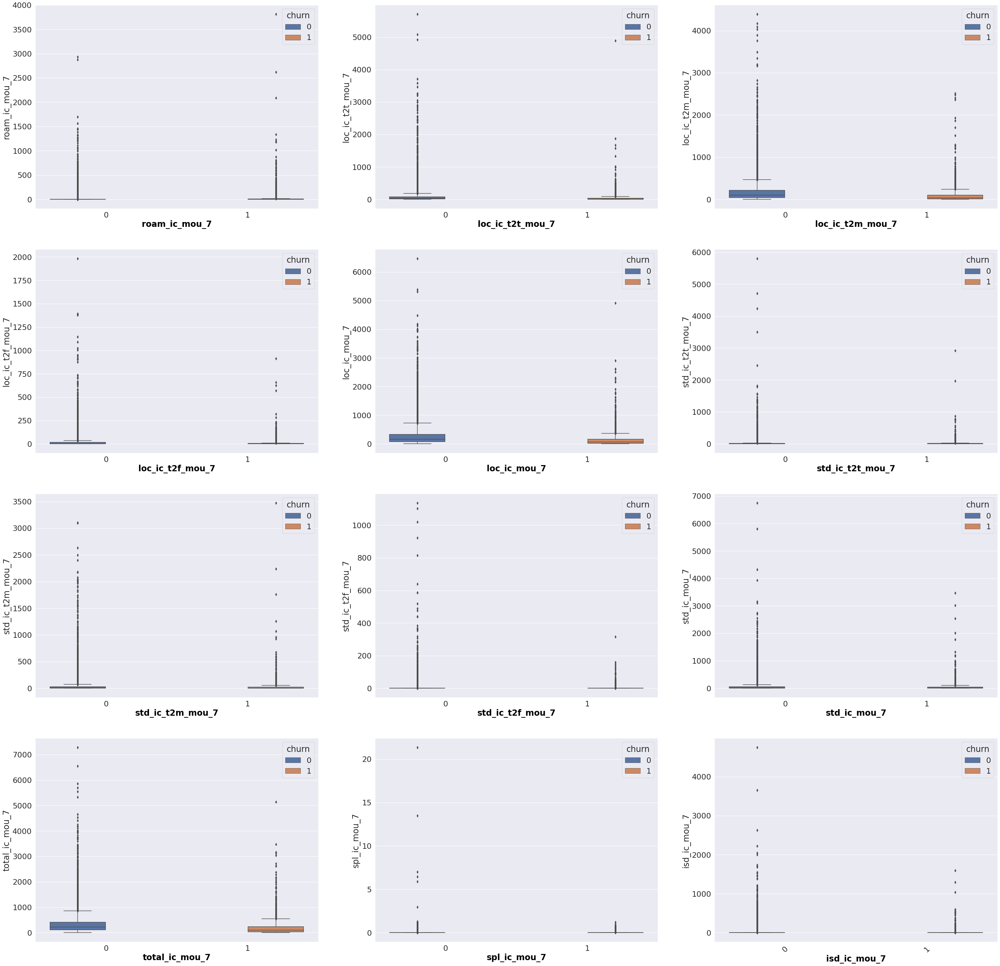

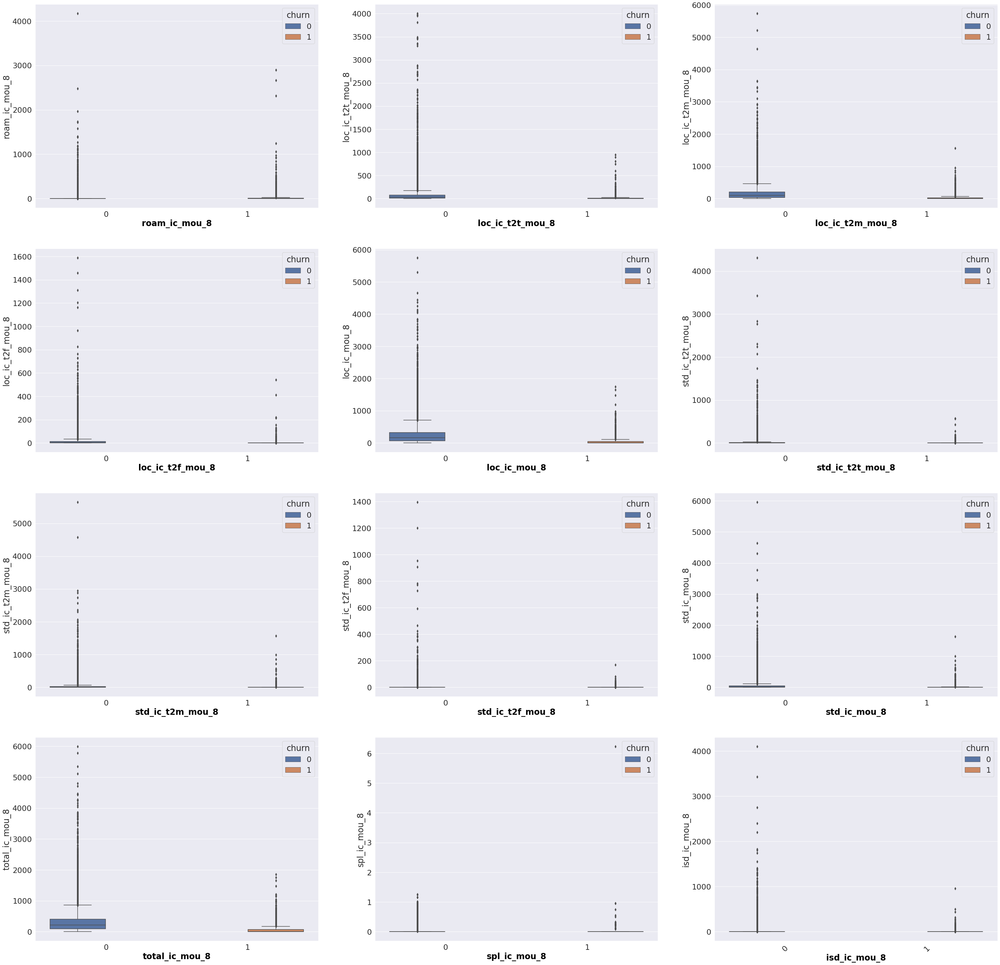

In [53]:
for i in mnth_list:
  plot_boxsubplots(i, hv_cust, fig_size=(50, 50))

In [54]:
#Identify the outgoing usage columns and find the patterns and outliers.
og_jun_usg = [col for col in hv_cust.columns if all(k in col for k in ['mou', '_6', 'og'] )]
og_jul_usg = [col for col in hv_cust.columns if all(k in col for k in ['mou', '_7', 'og'] )]
og_aug_usg = [col for col in hv_cust.columns if all(k in col for k in ['mou', '_8', 'og'] )]

print(og_jun_usg)
print(og_jul_usg)
print(og_aug_usg)

for i in mnth_list:
  display(hv_cust[i].describe().T)

['roam_og_mou_6', 'loc_og_t2t_mou_6', 'loc_og_t2m_mou_6', 'loc_og_t2f_mou_6', 'loc_og_t2c_mou_6', 'loc_og_mou_6', 'std_og_t2t_mou_6', 'std_og_t2m_mou_6', 'std_og_t2f_mou_6', 'std_og_mou_6', 'isd_og_mou_6', 'spl_og_mou_6', 'total_og_mou_6']
['roam_og_mou_7', 'loc_og_t2t_mou_7', 'loc_og_t2m_mou_7', 'loc_og_t2f_mou_7', 'loc_og_t2c_mou_7', 'loc_og_mou_7', 'std_og_t2t_mou_7', 'std_og_t2m_mou_7', 'std_og_t2f_mou_7', 'std_og_mou_7', 'isd_og_mou_7', 'spl_og_mou_7', 'total_og_mou_7']
['roam_og_mou_8', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_8', 'loc_og_t2f_mou_8', 'loc_og_t2c_mou_8', 'loc_og_mou_8', 'std_og_t2t_mou_8', 'std_og_t2m_mou_8', 'std_og_t2f_mou_8', 'std_og_mou_8', 'isd_og_mou_8', 'spl_og_mou_8', 'total_og_mou_8']


,count,mean,std,min,25%,50%,75%,max
roam_ic_mou_6,"29,979.000",17.428,79.193,0.000,0.000,0.000,0.000,"2,613.310"
loc_ic_t2t_mou_6,"29,979.000",68.772,158.703,0.000,8.290,29.140,73.670,"6,351.440"
loc_ic_t2m_mou_6,"29,979.000",159.679,222.093,0.000,33.460,93.980,202.920,"4,693.860"
loc_ic_t2f_mou_6,"29,979.000",15.605,45.848,0.000,0.000,1.960,12.440,"1,678.410"
loc_ic_mou_6,"29,979.000",244.065,312.931,0.000,56.710,151.080,315.620,"6,496.110"
std_ic_t2t_mou_6,"29,979.000",16.238,78.900,0.000,0.000,1.060,10.285,"5,459.560"
std_ic_t2m_mou_6,"29,979.000",32.030,101.127,0.000,0.455,7.090,27.560,"4,630.230"
std_ic_t2f_mou_6,"29,979.000",2.877,19.939,0.000,0.000,0.000,0.180,"1,351.110"
std_ic_mou_6,"29,979.000",51.150,140.565,0.000,2.630,15.060,47.560,"5,459.630"
total_ic_mou_6,"29,979.000",307.624,361.286,0.000,90.035,205.340,393.835,"6,798.640"


,count,mean,std,min,25%,50%,75%,max
roam_ic_mou_7,"29,979.000",13.535,76.343,0.000,0.000,0.000,0.000,"3,813.290"
loc_ic_t2t_mou_7,"29,979.000",70.329,167.371,0.000,9.470,30.130,74.735,"5,709.590"
loc_ic_t2m_mou_7,"29,979.000",160.856,219.513,0.000,38.130,96.840,203.535,"4,388.730"
loc_ic_t2f_mou_7,"29,979.000",16.519,49.501,0.000,0.000,2.210,13.040,"1,983.010"
loc_ic_mou_7,"29,979.000",247.714,315.581,0.000,63.550,154.860,316.785,"6,466.740"
std_ic_t2t_mou_7,"29,979.000",16.906,84.735,0.000,0.000,1.200,10.990,"5,800.930"
std_ic_t2m_mou_7,"29,979.000",33.489,105.835,0.000,0.480,7.480,29.250,"3,470.380"
std_ic_t2f_mou_7,"29,979.000",2.995,20.522,0.000,0.000,0.000,0.260,"1,136.080"
std_ic_mou_7,"29,979.000",53.395,149.237,0.000,2.785,16.130,50.390,"6,745.760"
total_ic_mou_7,"29,979.000",314.954,369.768,0.000,98.840,211.240,396.915,"7,279.080"


,count,mean,std,min,25%,50%,75%,max
roam_ic_mou_8,"29,979.000",13.263,74.588,0.000,0.000,0.000,0.000,"4,169.810"
loc_ic_t2t_mou_8,"29,979.000",65.959,155.769,0.000,6.810,26.840,70.360,"4,003.210"
loc_ic_t2m_mou_8,"29,979.000",153.649,217.059,0.000,29.660,89.830,197.015,"5,738.460"
loc_ic_t2f_mou_8,"29,979.000",14.713,43.730,0.000,0.000,1.850,11.610,"1,588.530"
loc_ic_mou_8,"29,979.000",234.331,307.121,0.000,49.990,142.880,302.110,"5,748.810"
std_ic_t2t_mou_8,"29,979.000",15.061,72.470,0.000,0.000,0.560,8.860,"4,309.290"
std_ic_t2m_mou_8,"29,979.000",30.433,105.329,0.000,0.000,5.710,25.330,"5,645.860"
std_ic_t2f_mou_8,"29,979.000",2.683,20.280,0.000,0.000,0.000,0.130,"1,394.890"
std_ic_mou_8,"29,979.000",48.181,141.010,0.000,1.430,12.560,43.435,"5,957.140"
total_ic_mou_8,"29,979.000",295.473,360.412,0.000,78.930,193.530,380.450,"5,990.710"


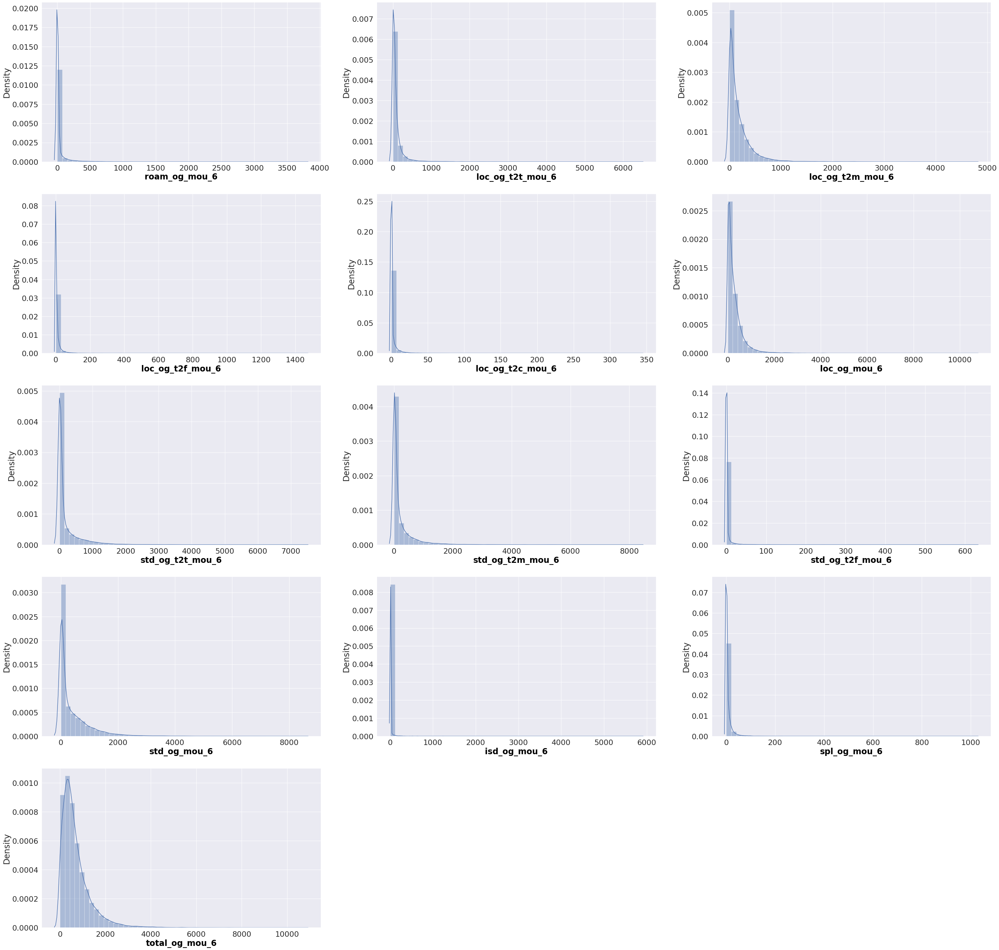

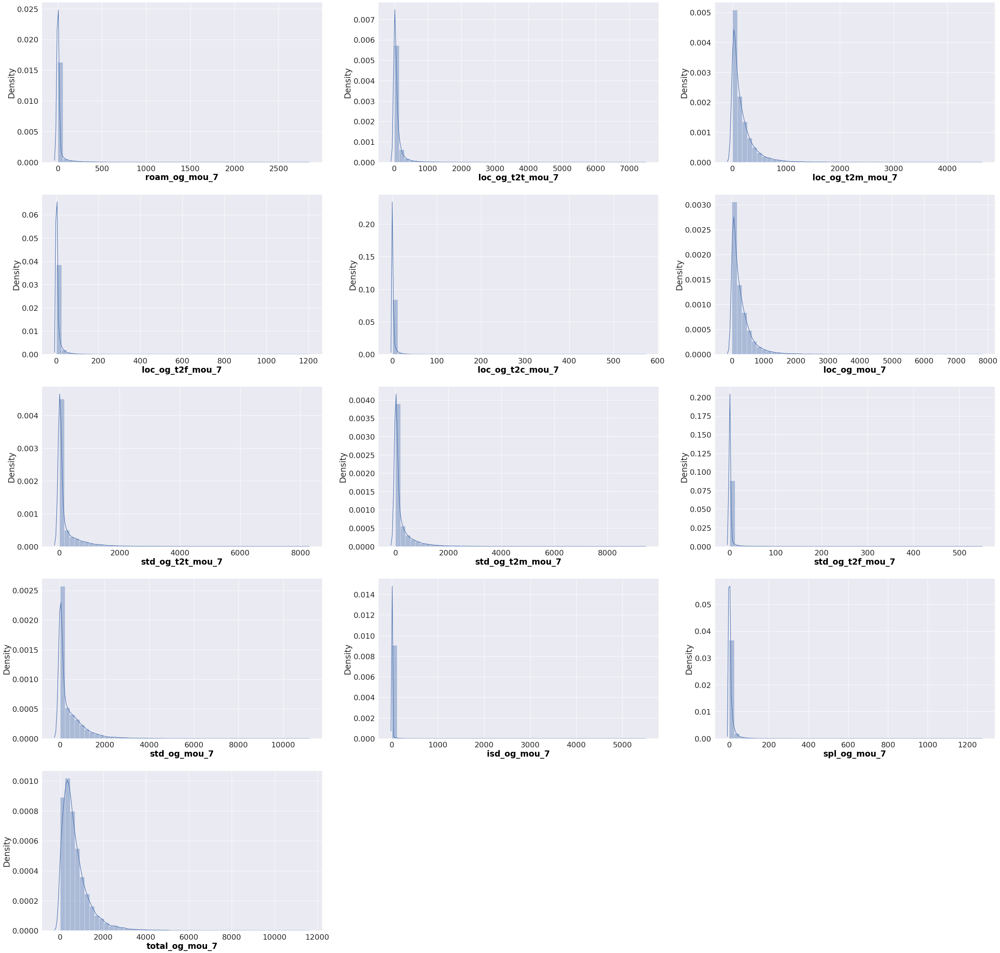

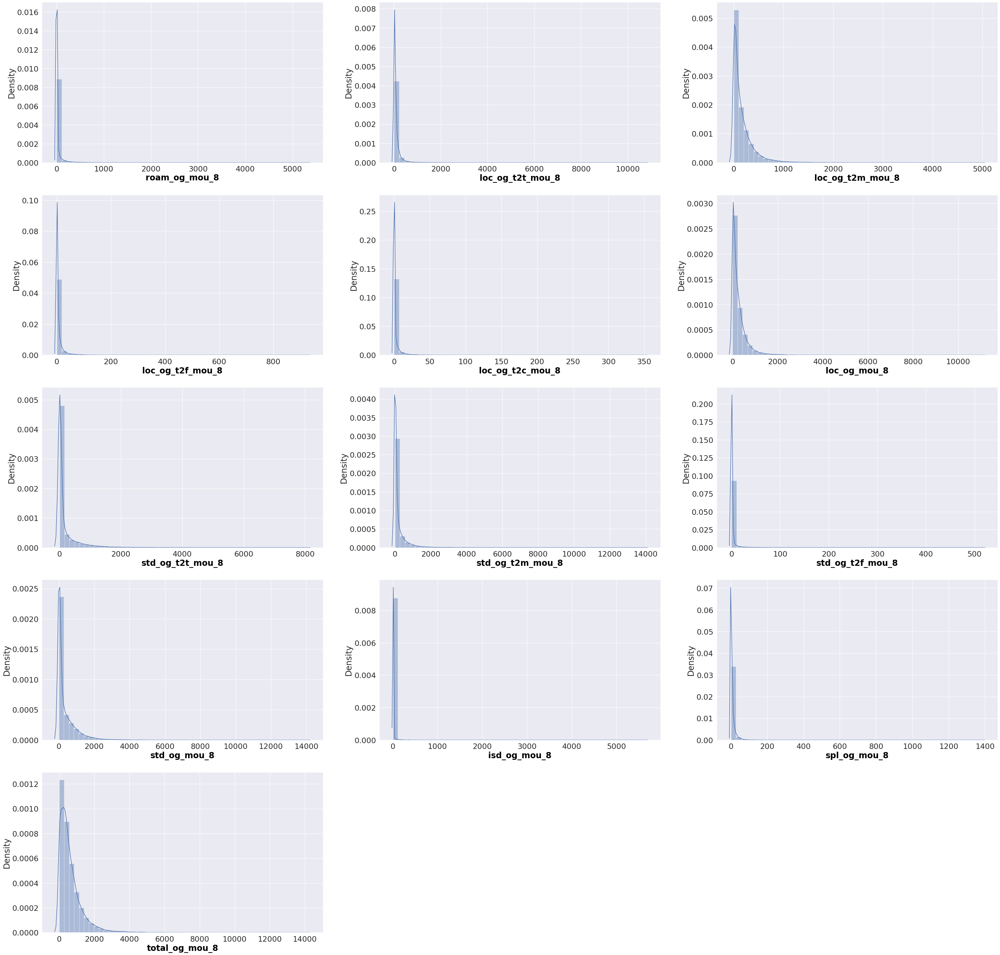

In [55]:
mnth_list = [og_jun_usg, og_jul_usg, og_aug_usg]
for i in mnth_list:
  plot_distsubplots(i, hv_cust, fig_size=(50, 50))

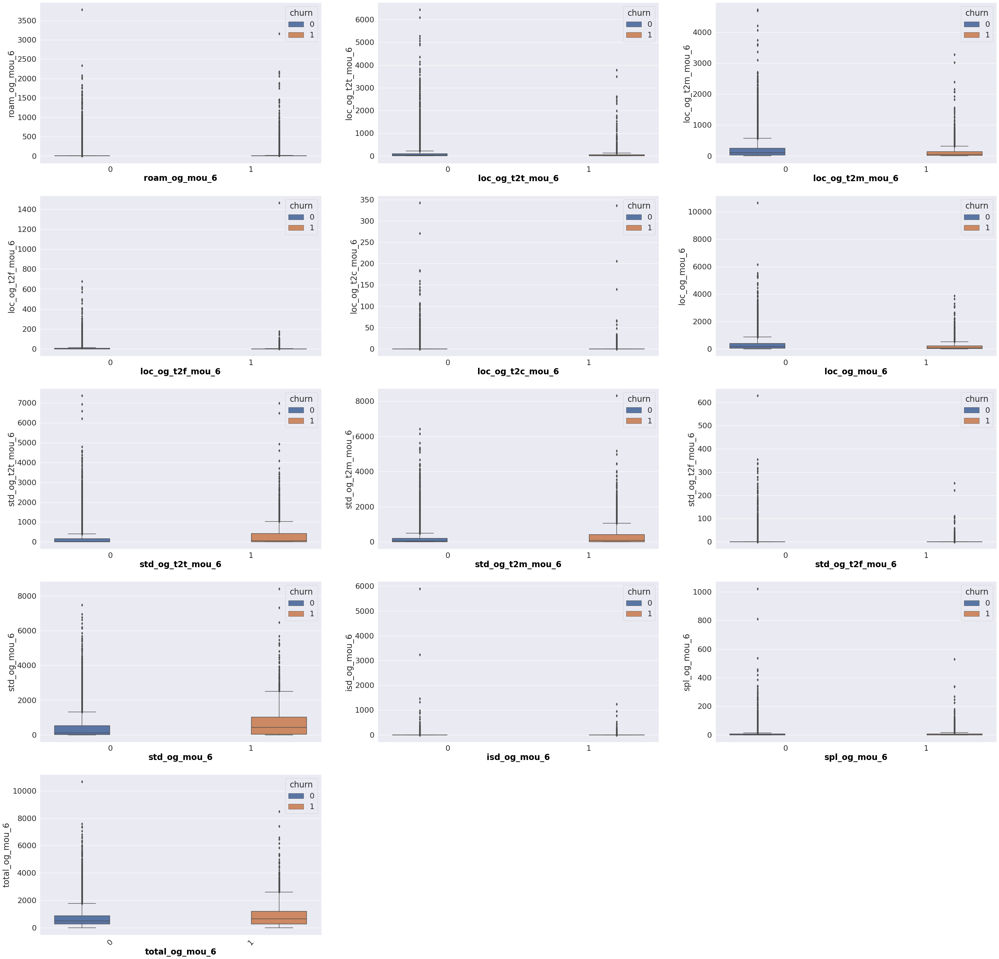

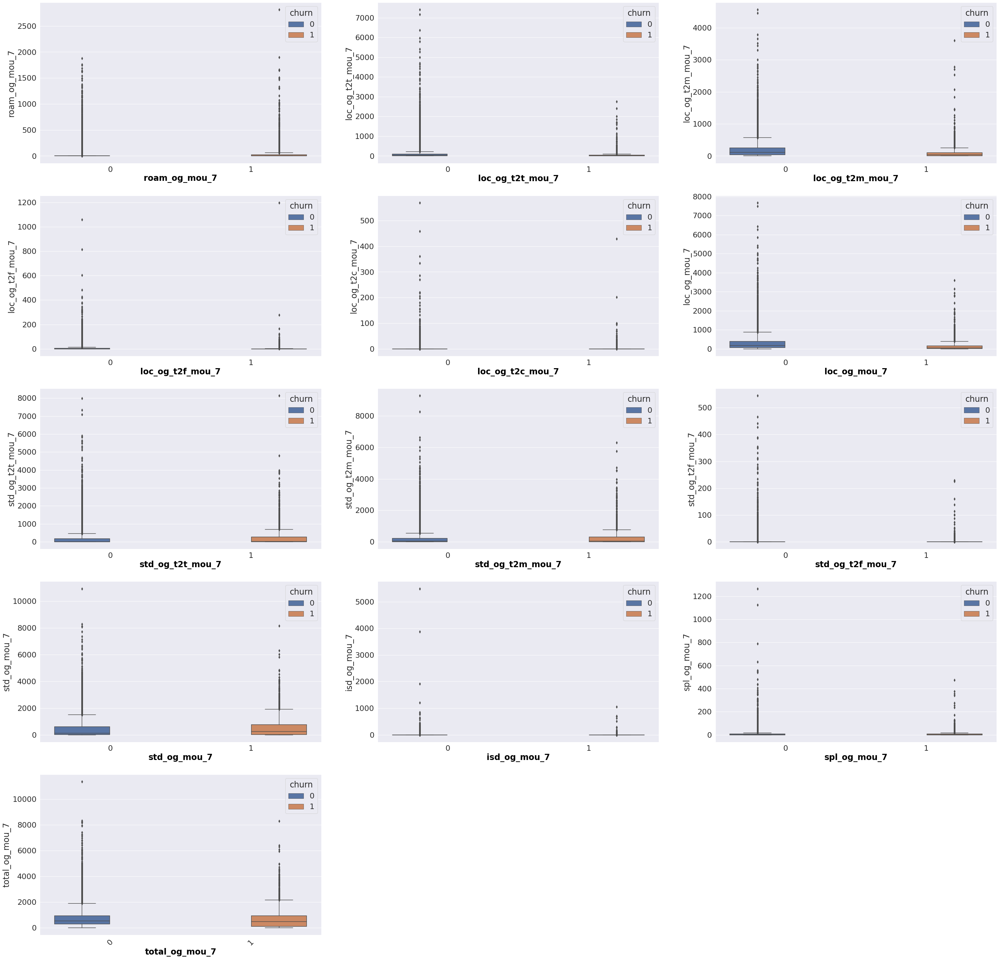

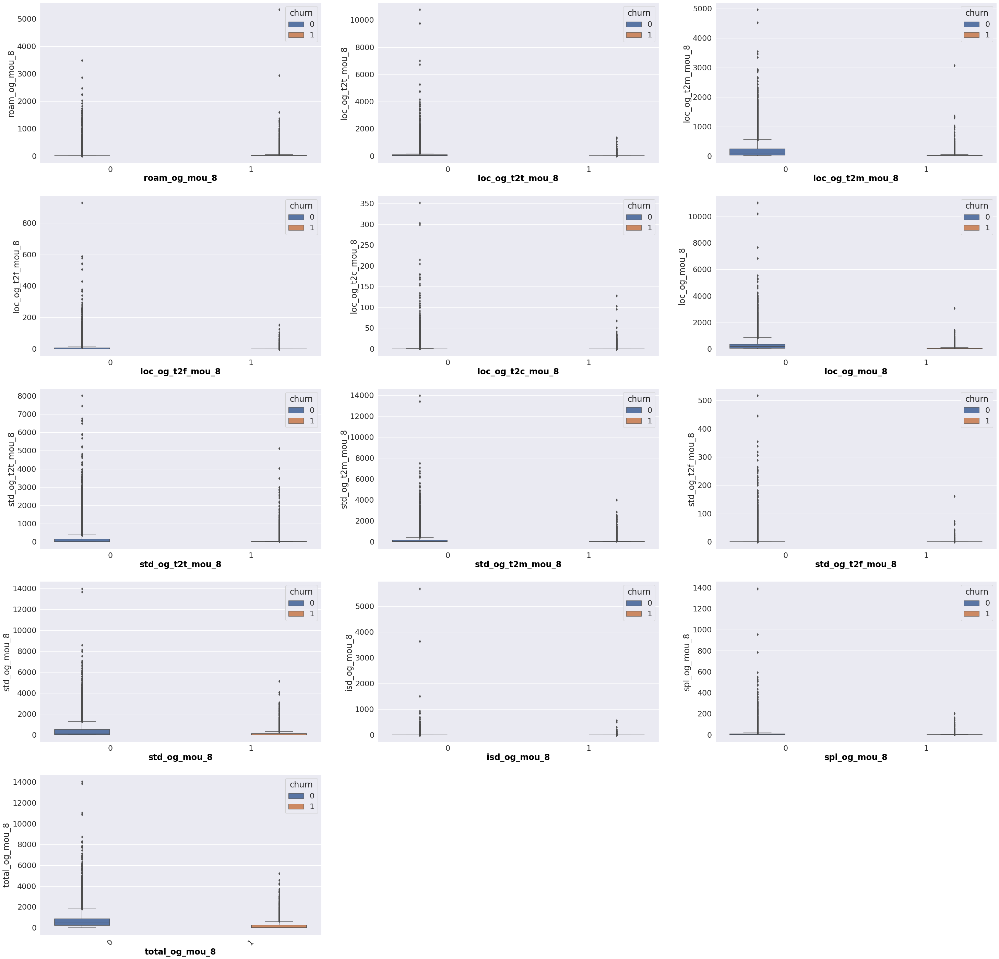

In [56]:
for i in mnth_list:
  plot_boxsubplots(i, hv_cust, fig_size=(50, 50))

['total_rech_num_6', 'total_rech_amt_6', 'max_rech_amt_6', 'total_rech_data_6', 'max_rech_data_6', 'count_rech_2g_6', 'count_rech_3g_6', 'av_rech_amt_data_6']
['total_rech_num_7', 'total_rech_amt_7', 'max_rech_amt_7', 'total_rech_data_7', 'max_rech_data_7', 'count_rech_2g_7', 'count_rech_3g_7', 'av_rech_amt_data_7']
['total_rech_num_8', 'total_rech_amt_8', 'max_rech_amt_8', 'total_rech_data_8', 'max_rech_data_8', 'count_rech_2g_8', 'count_rech_3g_8', 'av_rech_amt_data_8']


,count,mean,std,min,25%,50%,75%,max
roam_og_mou_6,"29,979.000",29.348,118.630,0.000,0.000,0.000,0.000,"3,775.110"
loc_og_t2t_mou_6,"29,979.000",94.734,236.961,0.000,8.330,32.610,91.550,"6,431.330"
loc_og_t2m_mou_6,"29,979.000",181.337,250.231,0.000,30.290,101.280,240.230,"4,729.740"
loc_og_t2f_mou_6,"29,979.000",6.979,22.672,0.000,0.000,0.330,5.090,"1,466.030"
loc_og_t2c_mou_6,"29,979.000",1.568,6.892,0.000,0.000,0.000,0.000,342.860
loc_og_mou_6,"29,979.000",283.058,380.140,0.000,51.010,166.330,374.600,"10,643.380"
std_og_t2t_mou_6,"29,979.000",189.892,409.872,0.000,0.000,12.880,178.355,"7,366.580"
std_og_t2m_mou_6,"29,979.000",203.212,413.660,0.000,1.600,37.760,211.210,"8,314.760"
std_og_t2f_mou_6,"29,979.000",2.012,12.464,0.000,0.000,0.000,0.000,628.560
std_og_mou_6,"29,979.000",395.120,606.719,0.000,5.960,126.360,573.375,"8,432.990"


,count,mean,std,min,25%,50%,75%,max
roam_og_mou_7,"29,979.000",22.056,97.975,0.000,0.000,0.000,0.000,"2,812.040"
loc_og_t2t_mou_7,"29,979.000",95.787,248.250,0.000,9.130,33.190,91.535,"7,400.660"
loc_og_t2m_mou_7,"29,979.000",181.324,240.816,0.000,33.580,104.360,239.485,"4,557.140"
loc_og_t2f_mou_7,"29,979.000",7.100,22.599,0.000,0.000,0.400,5.260,"1,196.430"
loc_og_t2c_mou_7,"29,979.000",1.864,9.260,0.000,0.000,0.000,0.100,569.710
loc_og_mou_7,"29,979.000",284.220,375.994,0.000,56.710,170.460,376.035,"7,674.780"
std_og_t2t_mou_7,"29,979.000",200.061,428.304,0.000,0.000,13.440,191.660,"8,133.660"
std_og_t2m_mou_7,"29,979.000",213.517,438.106,0.000,1.350,37.560,223.020,"9,284.740"
std_og_t2f_mou_7,"29,979.000",2.036,13.357,0.000,0.000,0.000,0.000,544.630
std_og_mou_7,"29,979.000",415.618,637.673,0.000,5.570,132.240,615.440,"10,936.730"


,count,mean,std,min,25%,50%,75%,max
roam_og_mou_8,"29,979.000",21.484,106.295,0.000,0.000,0.000,0.000,"5,337.040"
loc_og_t2t_mou_8,"29,979.000",87.185,234.833,0.000,5.790,28.640,84.700,"10,752.560"
loc_og_t2m_mou_8,"29,979.000",167.617,234.897,0.000,22.420,89.880,223.615,"4,961.330"
loc_og_t2f_mou_8,"29,979.000",6.496,20.228,0.000,0.000,0.160,4.680,928.490
loc_og_t2c_mou_8,"29,979.000",1.714,7.401,0.000,0.000,0.000,0.050,351.830
loc_og_mou_8,"29,979.000",261.306,366.664,0.000,38.280,148.280,348.340,"11,039.910"
std_og_t2t_mou_8,"29,979.000",172.355,410.213,0.000,0.000,5.960,133.210,"8,014.430"
std_og_t2m_mou_8,"29,979.000",179.665,416.924,0.000,0.000,23.730,164.785,"13,950.040"
std_og_t2f_mou_8,"29,979.000",1.791,11.706,0.000,0.000,0.000,0.000,516.910
std_og_mou_8,"29,979.000",353.815,616.453,0.000,1.780,73.160,481.410,"13,980.060"


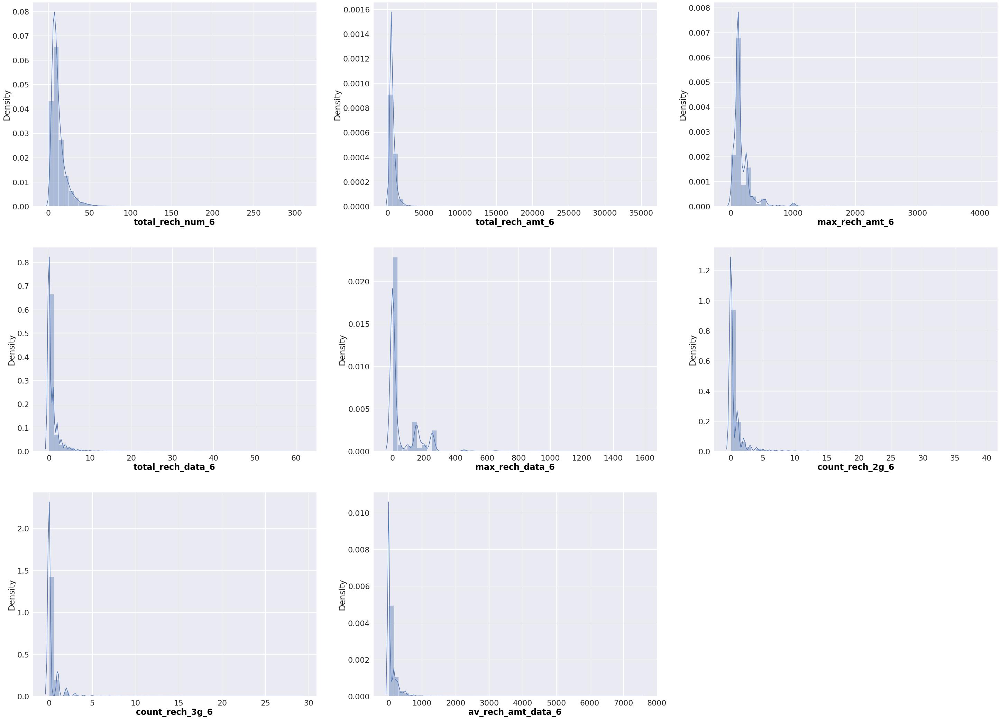

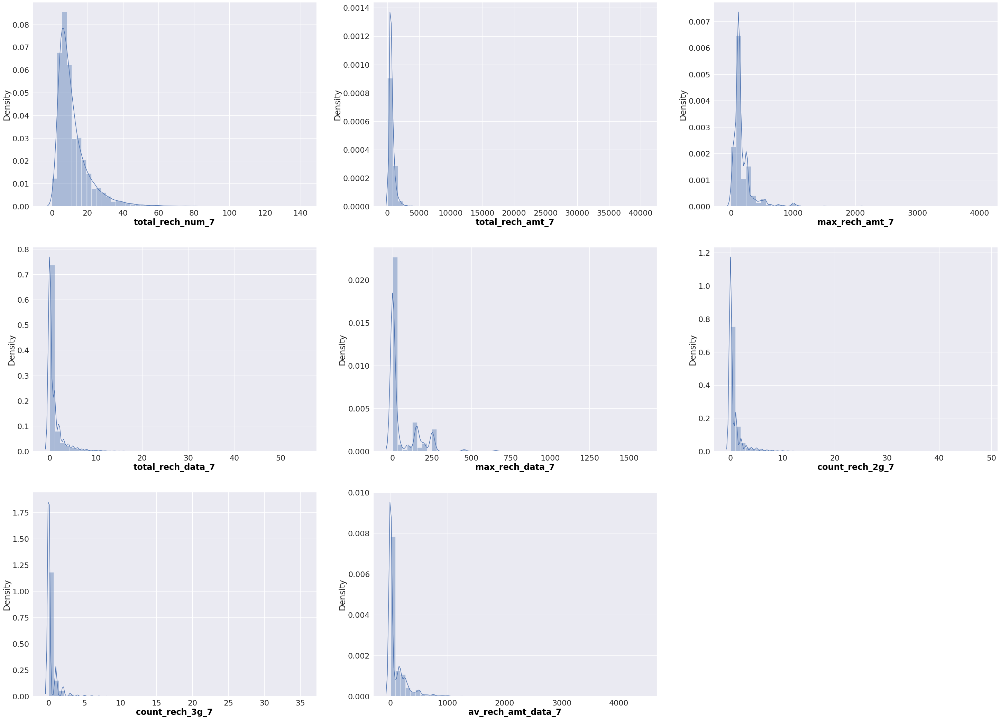

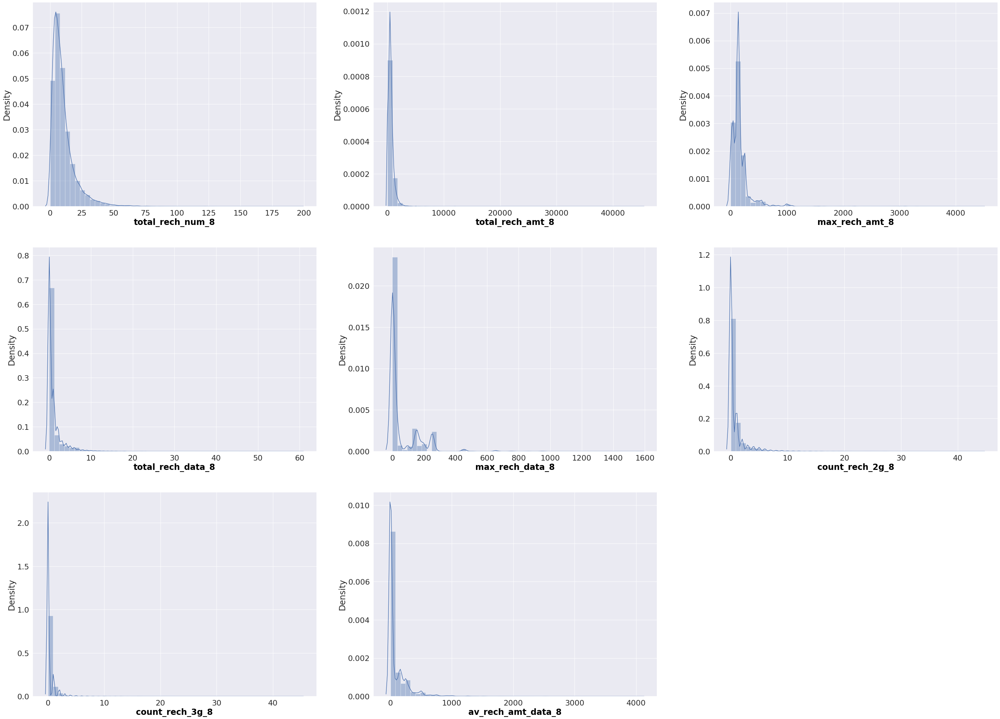

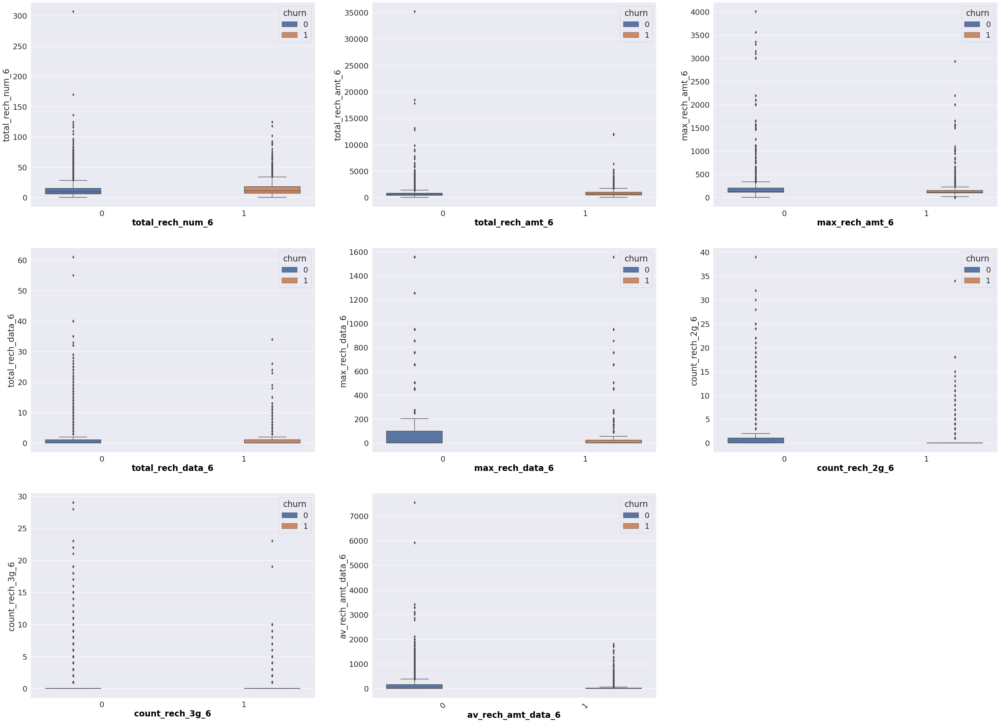

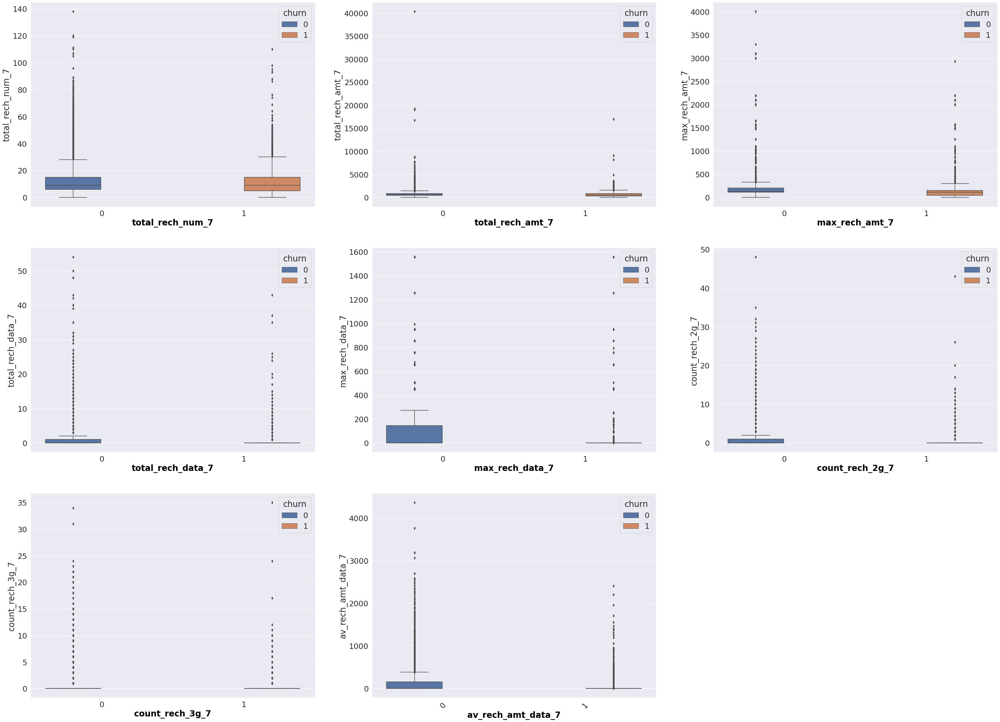

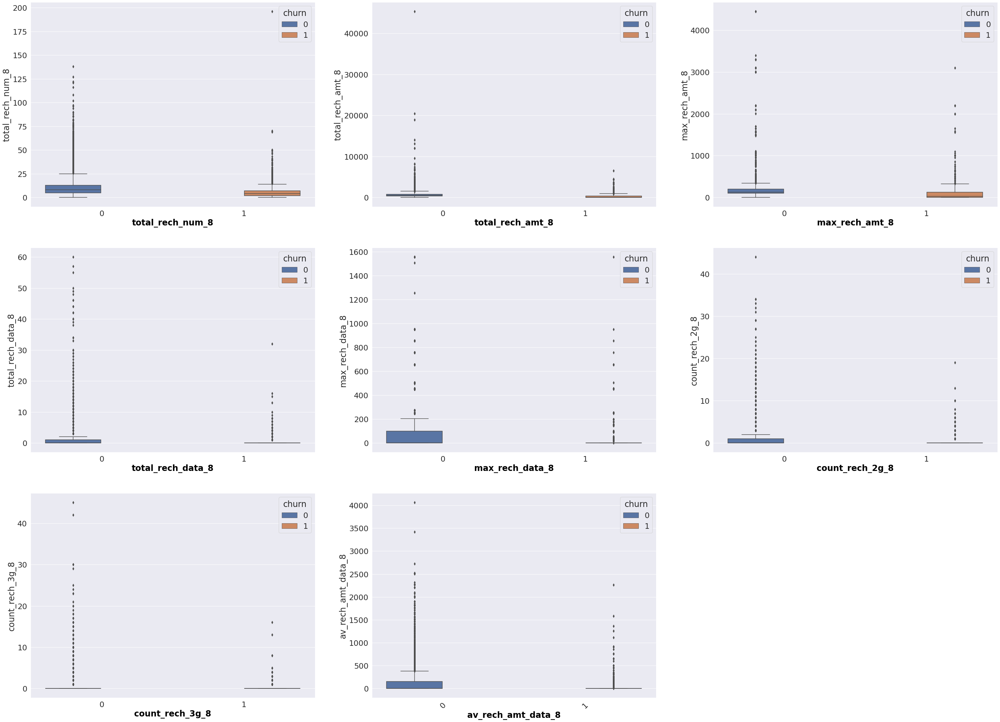

In [57]:
#Identify the outgoing usage columns and find the patterns and outliers.
rech_jun_usg = [col for col in hv_cust.columns if all(k in col for k in ['_6', 'rech'] )]
rech_jul_usg = [col for col in hv_cust.columns if all(k in col for k in ['_7', 'rech'] )]
rech_aug_usg = [col for col in hv_cust.columns if all(k in col for k in ['_8', 'rech'] )]

print(rech_jun_usg)
print(rech_jul_usg)
print(rech_aug_usg)

for i in mnth_list:
  display(hv_cust[i].describe().T)

mnth_list = [rech_jun_usg, rech_jul_usg, rech_aug_usg]
for i in mnth_list:
  plot_distsubplots(i, hv_cust, fig_size=(50, 50))

for i in mnth_list:
  plot_boxsubplots(i, hv_cust, fig_size=(50, 50))

['arpu_2g_6', 'arpu_3g_6', 'onnet_mou_6', 'offnet_mou_6']
['arpu_3g_7', 'onnet_mou_7', 'arpu_2g_7', 'offnet_mou_7']
['arpu_3g_8', 'onnet_mou_8', 'arpu_2g_8', 'offnet_mou_8']


,count,mean,std,min,25%,50%,75%,max
total_rech_num_6,"29,979.000",12.123,9.546,0.000,6.000,9.000,15.000,307.000
total_rech_amt_6,"29,979.000",697.720,539.488,0.000,433.000,585.000,838.000,"35,190.000"
max_rech_amt_6,"29,979.000",171.471,174.763,0.000,110.000,120.000,200.000,"4,010.000"
total_rech_data_6,"29,979.000",0.937,2.177,0.000,0.000,0.000,1.000,61.000
max_rech_data_6,"29,979.000",56.949,105.850,0.000,0.000,0.000,98.000,"1,555.000"
count_rech_2g_6,"29,979.000",0.625,1.731,0.000,0.000,0.000,1.000,39.000
count_rech_3g_6,"29,979.000",0.312,1.066,0.000,0.000,0.000,0.000,29.000
av_rech_amt_data_6,"29,979.000",90.789,191.273,0.000,0.000,0.000,154.000,"7,546.000"


,count,mean,std,min,25%,50%,75%,max
total_rech_num_7,"29,979.000",11.914,9.606,0.000,6.000,9.000,15.000,138.000
total_rech_amt_7,"29,979.000",696.309,562.328,0.000,427.000,581.000,836.000,"40,335.000"
max_rech_amt_7,"29,979.000",175.723,181.607,0.000,110.000,128.000,200.000,"4,010.000"
total_rech_data_7,"29,979.000",1.054,2.413,0.000,0.000,0.000,1.000,54.000
max_rech_data_7,"29,979.000",58.717,108.176,0.000,0.000,0.000,98.000,"1,555.000"
count_rech_2g_7,"29,979.000",0.718,1.931,0.000,0.000,0.000,1.000,48.000
count_rech_3g_7,"29,979.000",0.336,1.177,0.000,0.000,0.000,0.000,35.000
av_rech_amt_data_7,"29,979.000",97.605,198.436,0.000,0.000,0.000,154.000,"4,365.000"


,count,mean,std,min,25%,50%,75%,max
total_rech_num_8,"29,979.000",10.226,9.480,0.000,4.000,8.000,13.000,196.000
total_rech_amt_8,"29,979.000",613.908,602.048,0.000,309.000,520.000,790.000,"45,320.000"
max_rech_amt_8,"29,979.000",162.929,172.671,0.000,67.000,130.000,198.000,"4,449.000"
total_rech_data_8,"29,979.000",1.035,2.406,0.000,0.000,0.000,1.000,60.000
max_rech_data_8,"29,979.000",55.277,104.814,0.000,0.000,0.000,56.000,"1,555.000"
count_rech_2g_8,"29,979.000",0.722,1.871,0.000,0.000,0.000,1.000,44.000
count_rech_3g_8,"29,979.000",0.314,1.162,0.000,0.000,0.000,0.000,45.000
av_rech_amt_data_8,"29,979.000",89.803,185.887,0.000,0.000,0.000,145.000,"4,061.000"


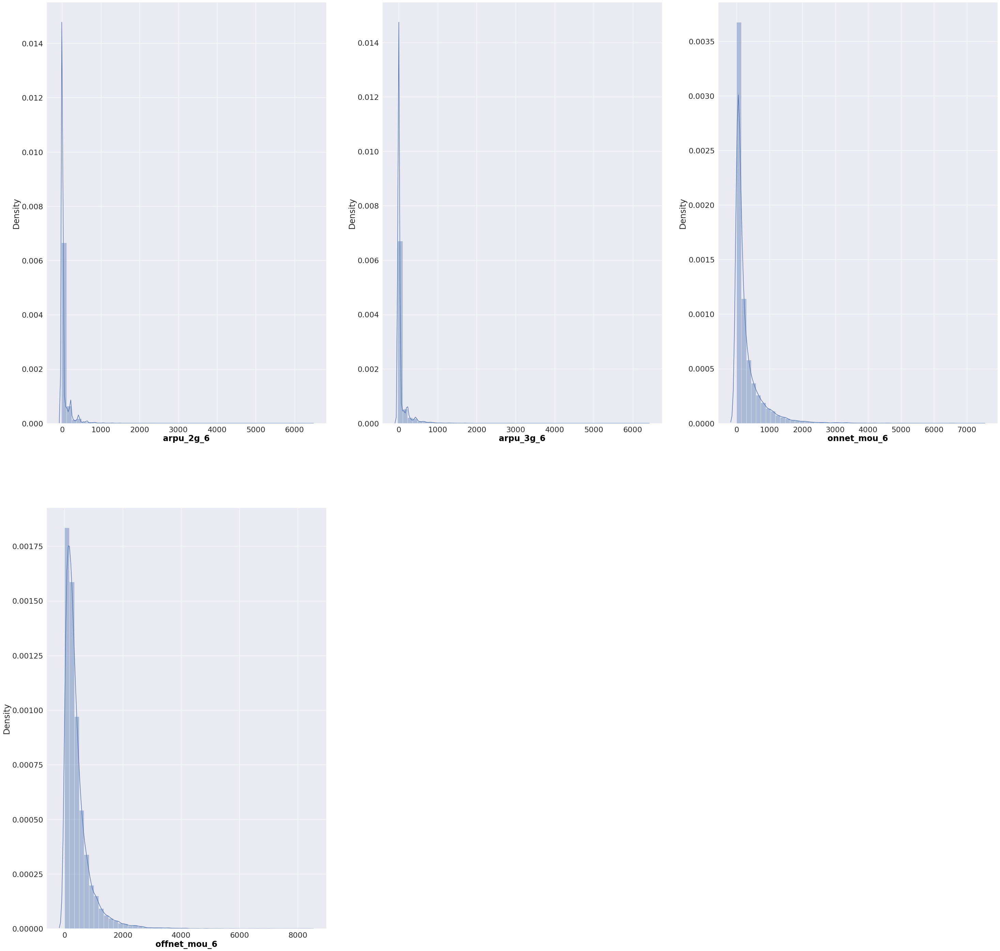

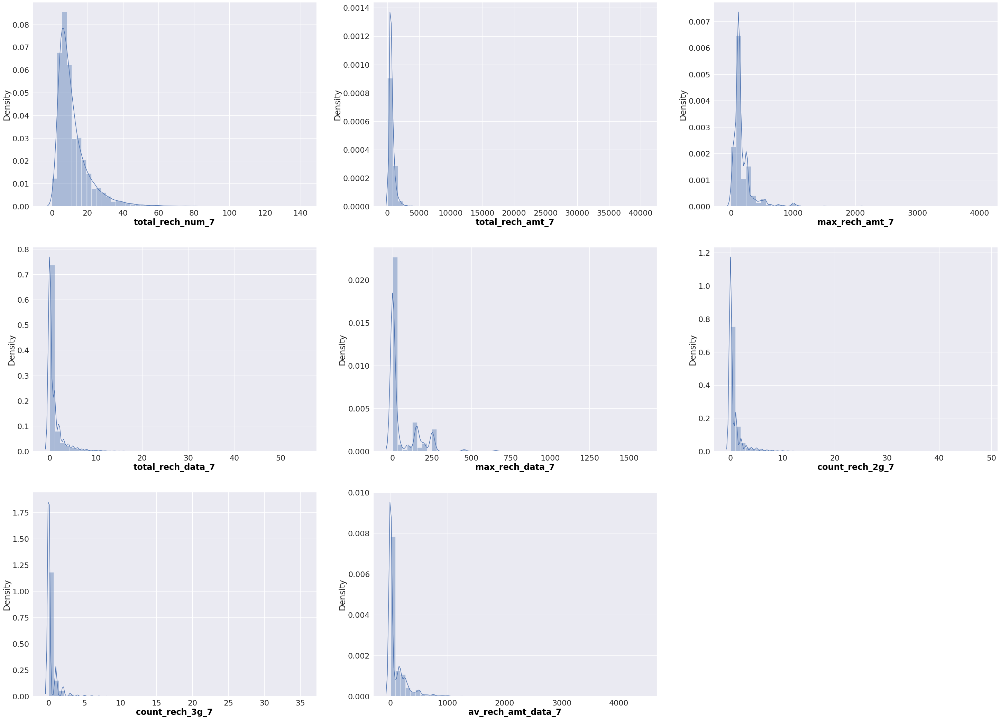

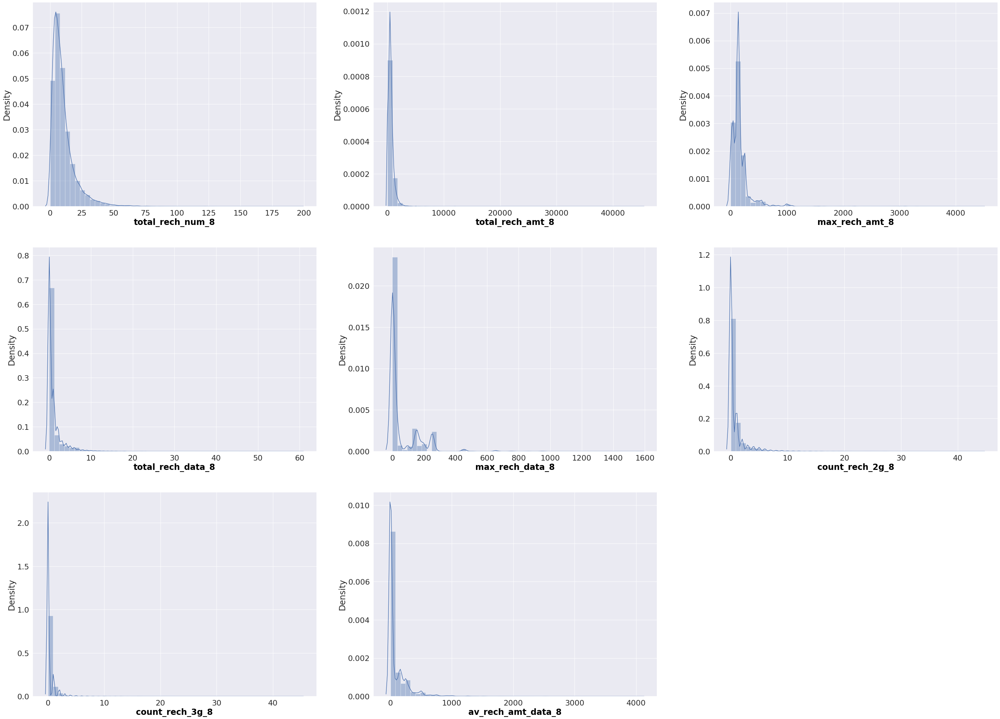

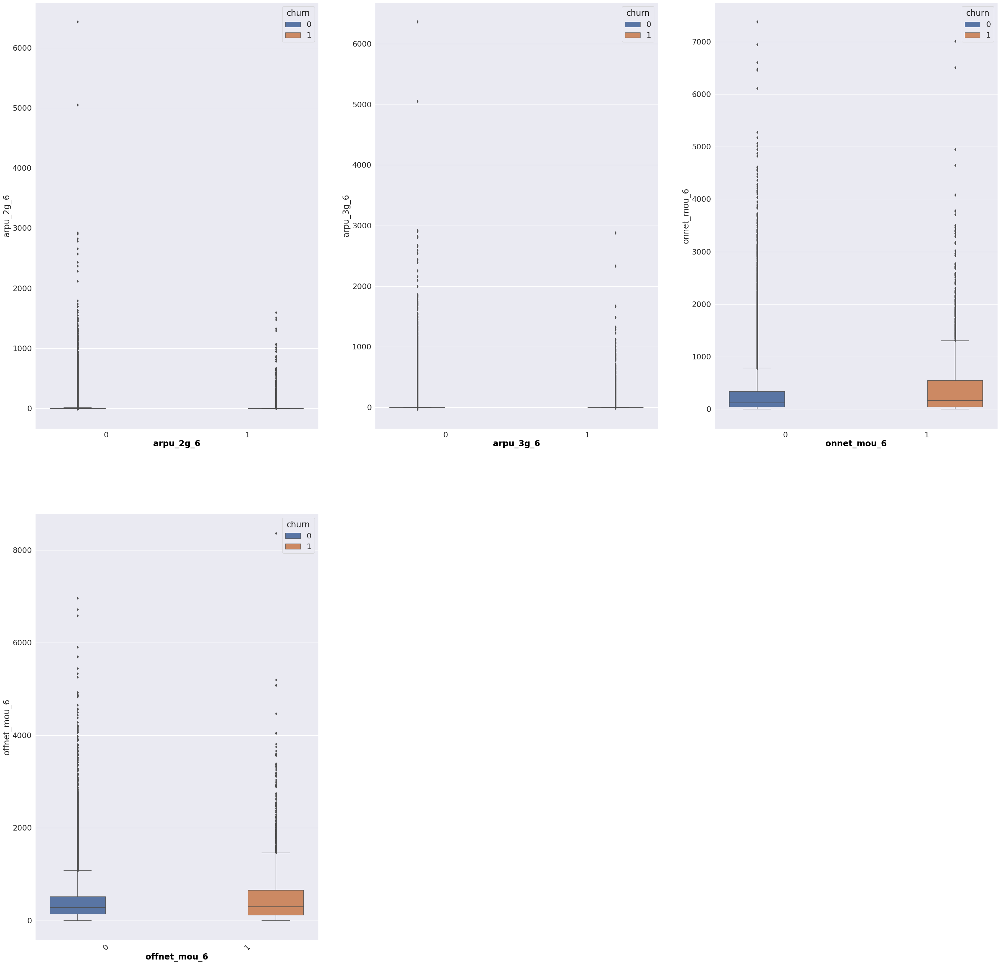

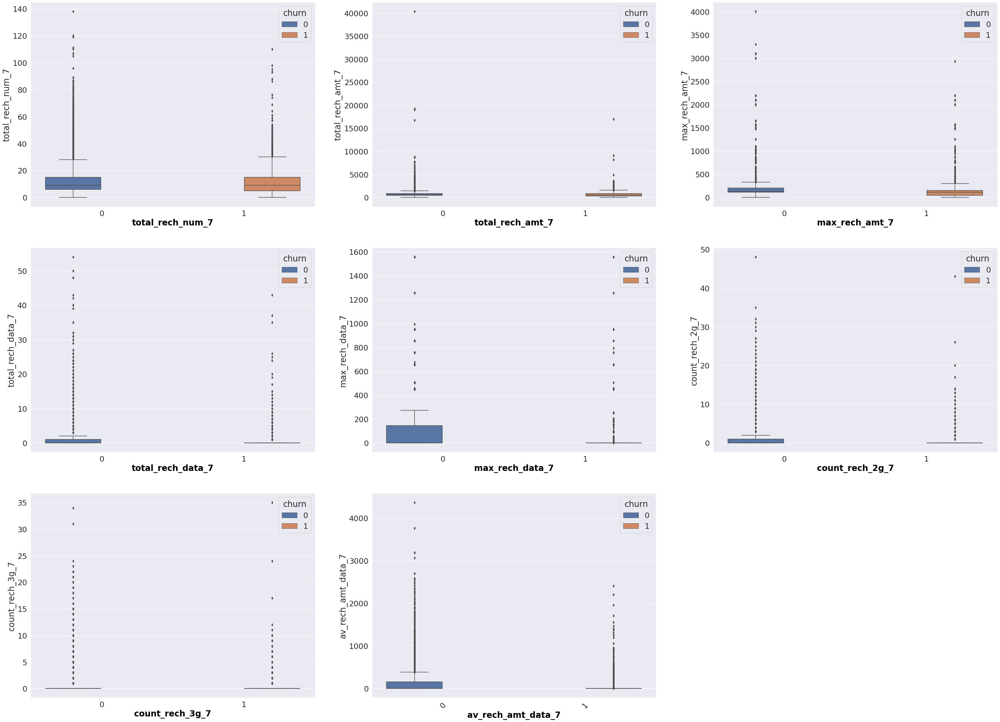

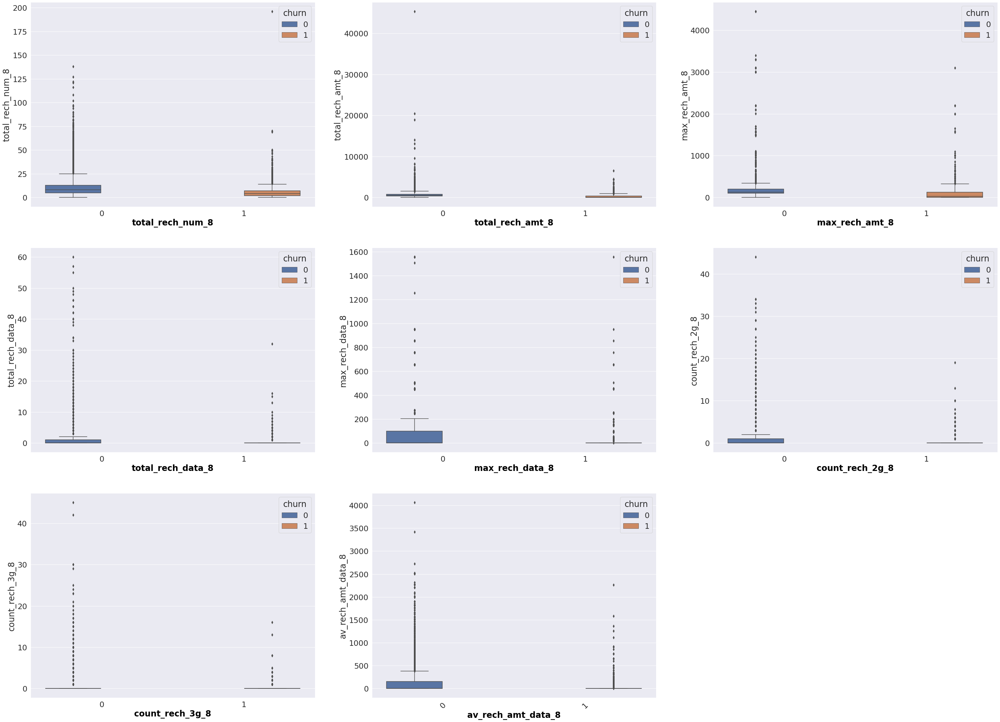

In [58]:
#
rem_jun_usg = [col for col in remaining_cols if all(k in col for k in ['_6'] )]
rem_jul_usg = [col for col in remaining_cols if all(k in col for k in ['_7'] )]
rem_aug_usg = [col for col in remaining_cols if all(k in col for k in ['_8'] )]

print(rem_jun_usg)
print(rem_jul_usg)
print(rem_aug_usg)

for i in mnth_list:
  display(hv_cust[i].describe().T)

mnth_list = [rem_jun_usg, rech_jul_usg, rech_aug_usg]
for i in mnth_list:
  plot_distsubplots(i, hv_cust, fig_size=(50, 50))

for i in mnth_list:
  plot_boxsubplots(i, hv_cust, fig_size=(50, 50))

#### Conclusion
- Based on the EDA, there are outliers available in the data. At EDA phase, the outliers are not treated as the scaling would reduce the impact of the outliers.

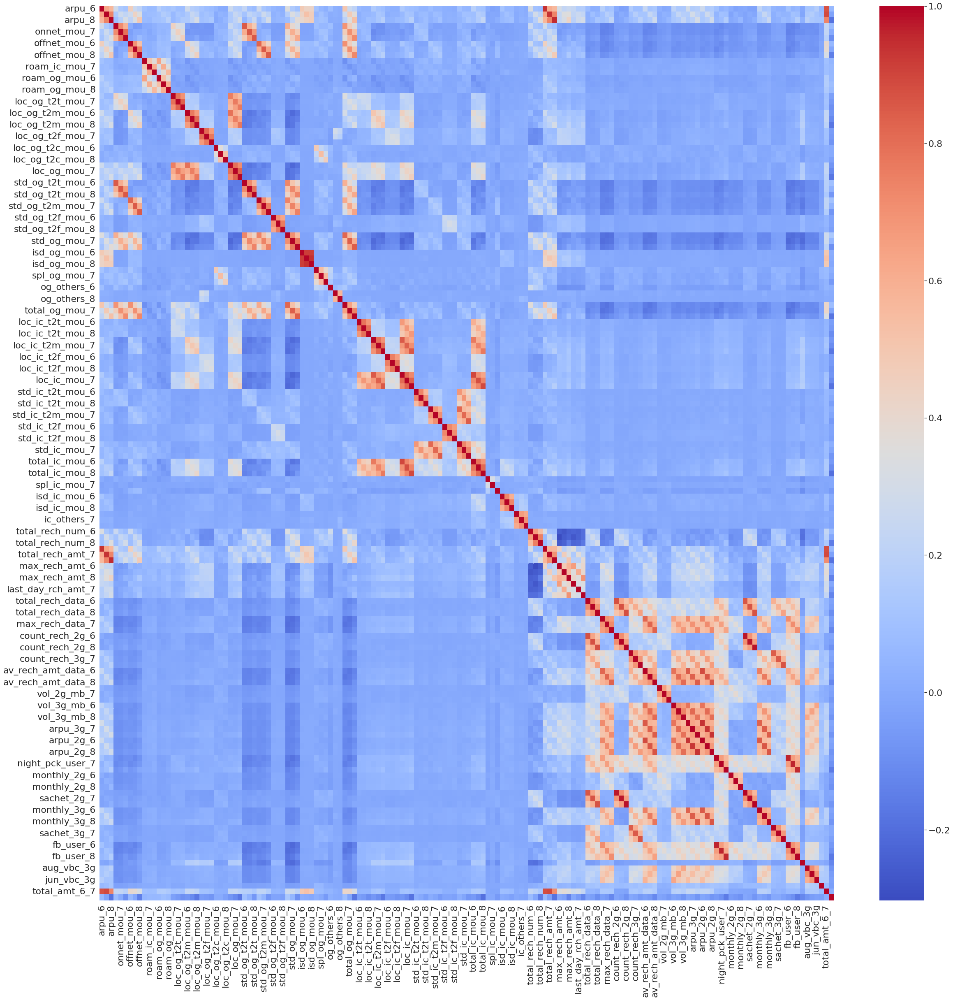

In [59]:
plt.figure(figsize=(40,40))
sns.heatmap(data=hv_cust.corr(),cmap='coolwarm')

In [60]:
hv_cust.corr().style.background_gradient().set_precision(2)

In [61]:
pd. set_option('display.max_rows', 500)
display(hv_cust.describe(percentiles=[0,.25,.50,0.90, 0.95,0.99]).T)
pd. set_option('display.max_rows', 60)


,count,mean,std,min,0%,25%,50%,90%,95%,99%,max
arpu_6,"29,979.000",587.588,442.849,"-2,258.709","-2,258.709",364.352,495.951,994.312,"1,240.977","1,983.590","27,731.088"
arpu_7,"29,979.000",589.425,463.049,"-2,014.045","-2,014.045",365.235,493.781,996.051,"1,261.848","1,999.510","35,145.834"
arpu_8,"29,979.000",535.068,492.448,-945.808,-945.808,289.782,452.232,985.499,"1,258.703","1,988.082","33,543.624"
onnet_mou_6,"29,979.000",296.236,460.941,0.000,0.000,41.170,125.890,795.354,"1,154.900","2,166.876","7,376.710"
onnet_mou_7,"29,979.000",304.592,481.967,0.000,0.000,41.045,125.560,825.486,"1,208.691","2,220.578","8,157.780"
onnet_mou_8,"29,979.000",267.809,466.750,0.000,0.000,27.070,99.590,724.182,"1,115.857","2,189.446","10,752.560"
offnet_mou_6,"29,979.000",418.128,470.773,0.000,0.000,137.340,282.260,916.490,"1,271.757","2,328.193","8,362.360"
offnet_mou_7,"29,979.000",424.103,486.710,0.000,0.000,135.690,282.040,935.716,"1,287.221","2,411.004","9,667.130"
offnet_mou_8,"29,979.000",375.160,477.657,0.000,0.000,95.730,241.040,854.006,"1,188.523","2,212.303","14,007.340"
roam_ic_mou_6,"29,979.000",17.428,79.193,0.000,0.000,0.000,0.000,32.740,94.663,349.546,"2,613.310"


In [62]:
q95=np.percentile(a=hv_cust,q=95,axis=0)
q50=np.percentile(a=hv_cust,q=50,axis=0)

In [90]:
df=pd.DataFrame(np.where(hv_cust>q95,q50,hv_cust),columns=hv_cust.columns)

In [93]:
df.skew().sort_values()

og_others_8         0.000
og_others_7         0.000
night_pck_user_8    0.484
total_rech_amt_8    0.497
night_pck_user_7    0.500
                    ...  
isd_og_mou_6        7.462
sep_vbc_3g          8.099
isd_og_mou_7        8.130
isd_og_mou_8        9.646
spl_ic_mou_7       12.539
Length: 154, dtype: float64

count   29,979.000
mean         0.018
std          0.182
min          0.000
25%          0.000
50%          0.000
75%          0.000
max         21.330
Name: spl_ic_mou_7, dtype: float64

# 4. Model Building

In [100]:
X=df.drop('churn',axis=1)
y=df['churn']

In [109]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42,stratify=y)

In [110]:
X_train.shape,y_train.shape

((20985, 153), (20985,))

In [112]:
# Instantiate SMOTE
sm = SMOTE(random_state=27)

# Fittign SMOTE to the train set
X_train, y_train = sm.fit_sample(X_train, y_train)

In [122]:
X_train.shape,y_train.shape

((38346, 153), (38346,))

In [123]:
scaler=StandardScaler()
X_train=scaler.fit_transform(X_train)

In [124]:
X_train

array([[ 0.59014183,  2.74349753,  0.22851952, ..., -0.32294041,
        -0.11337364,  2.03687477],
       [-0.74693406, -0.66165852,  1.00091684, ..., -0.32294041,
        -0.11337364, -1.10147804],
       [ 0.35039934, -0.1823547 ,  1.03297178, ...,  0.22111129,
        -0.11337364, -0.01636044],
       ...,
       [-0.19798778, -0.41027791, -1.03760026, ..., -0.32294041,
        -0.11337364, -0.5634894 ],
       [-0.33875743, -1.10157403, -1.19103005, ..., -0.32294041,
        -0.11337364, -1.0128395 ],
       [ 0.10986276, -0.26287735, -1.04935271, ..., -0.32294041,
        -0.11337364, -0.28946133]])

In [125]:
pca=PCA(random_state=42)

In [126]:
pca.fit(X_train)

PCA(copy=True, iterated_power='auto', n_components=None, random_state=42,
    svd_solver='auto', tol=0.0, whiten=False)

In [127]:
pca.components_

array([[ 1.50659397e-02,  6.40308376e-02,  1.07935618e-01, ...,
         9.14697508e-02,  3.16447872e-02,  4.24772352e-02],
       [ 2.07952680e-02,  9.20027345e-02,  1.14124877e-01, ...,
        -8.13836240e-02, -7.44947494e-03,  6.13667233e-02],
       [-1.25716763e-02,  1.42976392e-01,  1.45381602e-01, ...,
        -5.02794335e-03,  3.03971993e-03,  7.78131201e-02],
       ...,
       [-3.19757217e-03,  9.78649530e-03, -8.99026232e-03, ...,
        -1.72408548e-03,  4.52269184e-04, -4.19390619e-03],
       [ 2.17257075e-21, -5.88149452e-18, -1.82592721e-16, ...,
         6.39193428e-17, -4.66926066e-17, -1.83626287e-17],
       [-0.00000000e+00, -3.35895513e-17, -1.06713985e-16, ...,
         3.67791284e-17, -1.43764056e-18, -7.99705706e-17]])

In [128]:
pca.explained_variance_ratio_

array([1.38174430e-01, 8.21170788e-02, 5.23601885e-02, 3.31781248e-02,
       3.03907224e-02, 2.28362849e-02, 2.23302374e-02, 2.08855536e-02,
       1.89725435e-02, 1.75203374e-02, 1.50424235e-02, 1.42291955e-02,
       1.31881389e-02, 1.26738804e-02, 1.15750204e-02, 1.12043100e-02,
       1.05117813e-02, 1.04281731e-02, 1.00692983e-02, 9.46493565e-03,
       9.39513202e-03, 9.26840770e-03, 8.95180094e-03, 8.78502549e-03,
       8.64835421e-03, 8.26558899e-03, 8.09475625e-03, 7.27981989e-03,
       7.14231552e-03, 7.03046307e-03, 6.99381494e-03, 6.92705961e-03,
       6.78703318e-03, 6.70642727e-03, 6.60213244e-03, 6.48077626e-03,
       6.38938234e-03, 6.34366429e-03, 6.26848946e-03, 6.21854112e-03,
       6.11602089e-03, 6.10652436e-03, 5.98568400e-03, 5.88255388e-03,
       5.80653675e-03, 5.70982030e-03, 5.60674655e-03, 5.40126379e-03,
       5.38119812e-03, 5.32445594e-03, 5.21865250e-03, 5.19732266e-03,
       5.08516331e-03, 5.04984109e-03, 4.98748515e-03, 4.86504424e-03,
      

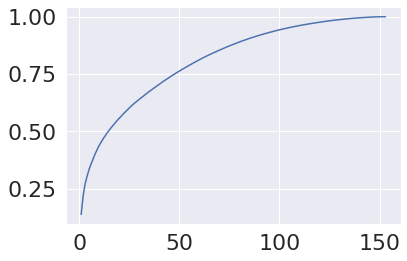

In [129]:
var_cumu = np.cumsum(pca.explained_variance_ratio_)
plt.plot(range(1,len(var_cumu)+1), var_cumu)

In [136]:
pc2 = PCA(n_components=100, random_state=42)

X_train_pc2 = pc2.fit_transform(X_train)

In [138]:
log_model=LogisticRegression(random_state=42)

log_model.fit(X_train_pc2,y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=42, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [141]:
log_model.predict(X_train_pc2)

array([1., 0., 0., ..., 1., 1., 1.])

<Figure size 2880x2880 with 0 Axes>

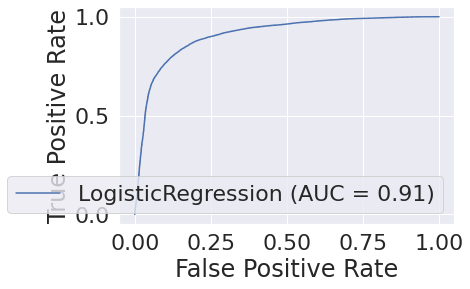

In [145]:
plt.figure(figsize=(40,40))
plot_roc_curve(log_model,X_train_pc2,y_train)
plt.show()

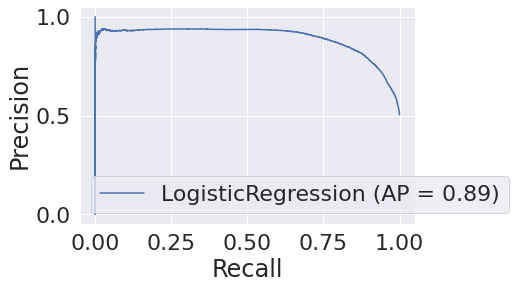

In [146]:
plot_precision_recall_curve(log_model,X_train_pc2,y_train)

In [149]:
print(classification_report(y_train,log_model.predict(X_train_pc2)))

              precision    recall  f1-score   support

         0.0       0.84      0.84      0.84     19173
         1.0       0.84      0.85      0.84     19173

    accuracy                           0.84     38346
   macro avg       0.84      0.84      0.84     38346
weighted avg       0.84      0.84      0.84     38346



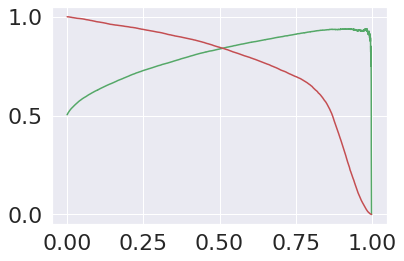

In [157]:
p, r, thresholds = precision_recall_curve(y_train,log_model.predict_proba(X_train_pc2)[:,1])
plt.plot(thresholds, p[:-1], "g-")
plt.plot(thresholds, r[:-1], "r-")
plt.show()

In [159]:
precision_recall_curve(y_train,log_model.predict_proba(X_train_pc2)[:,1])

(array([0.50427395, 0.50426092, 0.50427418, ..., 0.        , 0.        ,
        1.        ]),
 array([1.        , 0.99994784, 0.99994784, ..., 0.        , 0.        ,
        0.        ]),
 array([0.00139255, 0.00139602, 0.00140188, ..., 0.99650133, 0.99715396,
        0.99724004]))

In [161]:
X_test_pc2=pc2.transform(X_test)

In [162]:
X_test_pc2.shape

(8994, 100)

In [164]:
print(classification_report(y_test,log_model.predict(X_test_pc2)))

              precision    recall  f1-score   support

         0.0       0.94      0.98      0.96      8217
         1.0       0.54      0.30      0.38       777

    accuracy                           0.92      8994
   macro avg       0.74      0.64      0.67      8994
weighted avg       0.90      0.92      0.91      8994



In [165]:
dt=DecisionTreeClassifier()
dt.fit(X_train_pc2,y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [167]:
print(classification_report(y_train,dt.predict(X_train_pc2)))

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     19173
         1.0       1.00      1.00      1.00     19173

    accuracy                           1.00     38346
   macro avg       1.00      1.00      1.00     38346
weighted avg       1.00      1.00      1.00     38346



In [168]:
print(classification_report(y_test,dt.predict(X_test_pc2)))

              precision    recall  f1-score   support

         0.0       0.93      0.42      0.58      8217
         1.0       0.10      0.65      0.17       777

    accuracy                           0.44      8994
   macro avg       0.51      0.53      0.37      8994
weighted avg       0.85      0.44      0.54      8994



In [170]:
rf=RandomForestClassifier()
rf.fit(X_train_pc2,y_train)

print(classification_report(y_train,rf.predict(X_train_pc2)))
print(classification_report(y_test,rf.predict(X_test_pc2)))

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     19173
         1.0       1.00      1.00      1.00     19173

    accuracy                           1.00     38346
   macro avg       1.00      1.00      1.00     38346
weighted avg       1.00      1.00      1.00     38346

              precision    recall  f1-score   support

         0.0       0.91      0.99      0.95      8217
         1.0       0.19      0.03      0.05       777

    accuracy                           0.91      8994
   macro avg       0.55      0.51      0.50      8994
weighted avg       0.85      0.91      0.87      8994



In [172]:
ada=AdaBoostClassifier(base_estimator=rf)
ada.fit(X_train_pc2,y_train)

print(classification_report(y_train,ada.predict(X_train_pc2)))
print(classification_report(y_test,ada.predict(X_test_pc2)))

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     19173
         1.0       1.00      1.00      1.00     19173

    accuracy                           1.00     38346
   macro avg       1.00      1.00      1.00     38346
weighted avg       1.00      1.00      1.00     38346

              precision    recall  f1-score   support

         0.0       0.91      0.98      0.94      8217
         1.0       0.03      0.01      0.01       777

    accuracy                           0.89      8994
   macro avg       0.47      0.49      0.48      8994
weighted avg       0.84      0.89      0.86      8994



In [ ]:
params={'n_estimators':[5,50,100],
    'max_depth':[5,10,50,100],
    'min_samples_split':[2,5,10,50],
    'min_samples_leaf':[5,10,15]}

model = GridSearchCV(estimator = rf, 
                        param_grid = params, 
                        scoring= 'accuracy', 
                        cv = 2, 
                        verbose = 2,
                        return_train_score=True) 
model.fit(X_train_pc2,y_train)

print(classification_report(y_train,model.predict(X_train_pc2)))
print(classification_report(y_test,model.predict(X_test_pc2)))

Fitting 2 folds for each of 144 candidates, totalling 288 fits
[CV] max_depth=5, min_samples_leaf=5, min_samples_split=2, n_estimators=5 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  max_depth=5, min_samples_leaf=5, min_samples_split=2, n_estimators=5, total=   0.5s
[CV] max_depth=5, min_samples_leaf=5, min_samples_split=2, n_estimators=5 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  max_depth=5, min_samples_leaf=5, min_samples_split=2, n_estimators=5, total=   0.5s
[CV] max_depth=5, min_samples_leaf=5, min_samples_split=2, n_estimators=50 
[CV]  max_depth=5, min_samples_leaf=5, min_samples_split=2, n_estimators=50, total=   4.8s
[CV] max_depth=5, min_samples_leaf=5, min_samples_split=2, n_estimators=50 
[CV]  max_depth=5, min_samples_leaf=5, min_samples_split=2, n_estimators=50, total=   4.8s
[CV] max_depth=5, min_samples_leaf=5, min_samples_split=2, n_estimators=100 
[CV]  max_depth=5, min_samples_leaf=5, min_samples_split=2, n_estimators=100, total=   9.7s
[CV] max_depth=5, min_samples_leaf=5, min_samples_split=2, n_estimators=100 
[CV]  max_depth=5, min_samples_leaf=5, min_samples_split=2, n_estimators=100, total=   9.4s
[CV] max_depth=5, min_samples_leaf=5, min_samples_split=5, n_estimators=5 
[CV]  max_depth=5, min_samples_leaf=5, min_samples_split=5, n_estimators=5, total=   0.5s
[CV] max_depth=5, min_samples_leaf=5, min_samples_split=5, n_estimators=5

# 5. Model Selection

In [ ]:
data.head()

# 6. Model Evaluation

# 7. Conclusions: